<a href="https://colab.research.google.com/github/Rstam59/Machine-Learning-Projects/blob/main/Emotion_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!kaggle datasets download -d muhammadhananasghar/human-emotions-datasethes
!unzip human-emotions-datasethes.zip

Streaming output truncated to the last 5000 lines.
  inflating: EmotionsDataset/data/nothing/720.jpg  
  inflating: EmotionsDataset/data/nothing/721.jpg  
  inflating: EmotionsDataset/data/nothing/722.jpg  
  inflating: EmotionsDataset/data/nothing/723.jpg  
  inflating: EmotionsDataset/data/nothing/724.jpg  
  inflating: EmotionsDataset/data/nothing/725.jpg  
  inflating: EmotionsDataset/data/nothing/726.jpg  
  inflating: EmotionsDataset/data/nothing/727.jpg  
  inflating: EmotionsDataset/data/nothing/728.jpg  
  inflating: EmotionsDataset/data/nothing/729.jpg  
  inflating: EmotionsDataset/data/nothing/73.jpg  
  inflating: EmotionsDataset/data/nothing/730.jpg  
  inflating: EmotionsDataset/data/nothing/731.jpg  
  inflating: EmotionsDataset/data/nothing/732.jpg  
  inflating: EmotionsDataset/data/nothing/733.jpg  
  inflating: EmotionsDataset/data/nothing/734.jpg  
  inflating: EmotionsDataset/data/nothing/735.jpg  
  inflating: EmotionsDataset/data/nothing/736.jpg  
  inflating: E

In [4]:
import os
import json
import random
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, UnidentifiedImageError

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [5]:
SEED = 42

def set_seed(seed: int = 42) -> None:
    random.seed(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(SEED)

In [6]:
DATA_DIR = Path("/content/EmotionsDataset/data")

IMG_SIZE_CUSTOM = 128
IMG_SIZE_PRETRAINED = 224

BATCH_SIZE = 64
NUM_WORKERS = 2

device = 'cuda' if torch.cuda.is_available() else 'cpu'
PIN_MEMORY = True if device == 'cuda' else False
print("DEVICE:", device)

DEVICE: cuda


In [7]:
assert DATA_DIR.exists(), f"Dataset path does not exist: {DATA_DIR}"

class_names = sorted([p.name for p in DATA_DIR.iterdir() if p.is_dir()])
class_counts = len(class_names)
class_names, class_counts

(['angry', 'happy', 'nothing', 'sad'], 4)

In [8]:
valid_extensions = {".jpg", '.jpeg', '.png', '.bmp', '.webp'}

bad_files = []
valid_image_paths = []

for class_dir in DATA_DIR.iterdir():
    if not class_dir.is_dir():
        continue

    for img_path in class_dir.iterdir():
        if img_path.suffix.lower() not in valid_extensions:
            bad_files.append({
                'path': str(img_path),
                'reason': 'invalid extension'
            })
            continue

        try:
            with Image.open(img_path) as img:
                img.verify()

            with Image.open(img_path) as img:
                img.convert("RGB").load()

            valid_image_paths.append(img_path)
        except Exception as e:
            bad_files.append(str(img_path), e)

print('Total valid images:', len(valid_image_paths))
print('Total invalid images:', len(bad_files))

bad_files[:10]

Total valid images: 3945
Total invalid images: 0


[]

In [9]:
# for path in bad_files:
#     os.remove(path)

#Class distribution

In [10]:
class_counts = {}

for class_dir in DATA_DIR.iterdir():
    if class_dir.is_dir():
        count = len([p for p in class_dir.iterdir()])
        class_counts[class_dir.name] = count

class_counts

{'angry': 1064, 'sad': 751, 'happy': 1037, 'nothing': 1093}

In [11]:
df_counts = pd.DataFrame({
    'class': list(class_counts.keys()),
    'count': list(class_counts.values())
}).sort_values(by='count', ascending=False)

df_counts

,class,count
3,nothing,1093
0,angry,1064
2,happy,1037
1,sad,751


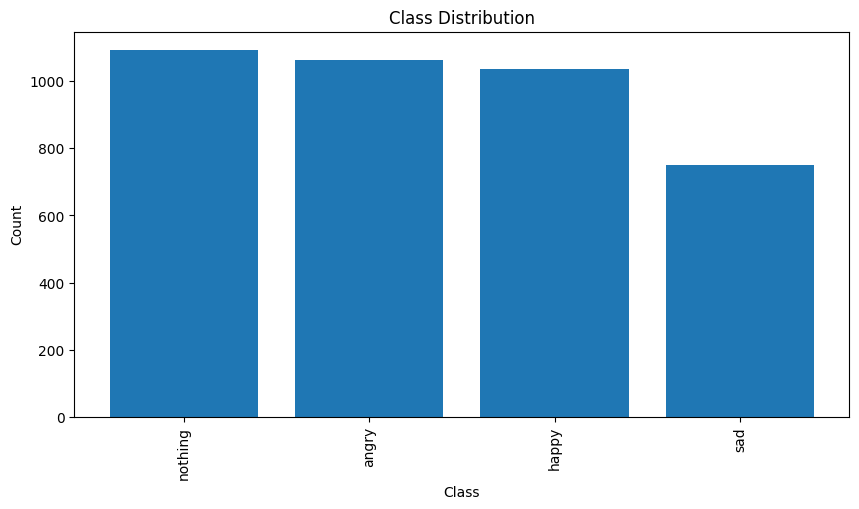

In [12]:
plt.figure(figsize=(10, 5))
plt.bar(df_counts['class'], df_counts['count'])
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(rotation=90);

In [13]:
metadata = {
    'data_dir': str(DATA_DIR),
    'num_classes': class_counts,
    'class_names': class_names,
    'total_valid_images': len(valid_image_paths),
    'total_bad_files': len(bad_files),
    'seed': SEED,
}

with open('dataset_metadata.json', 'w') as f:
    json.dump(metadata, f, indent=2)

print("Saved Metadata")

Saved Metadata


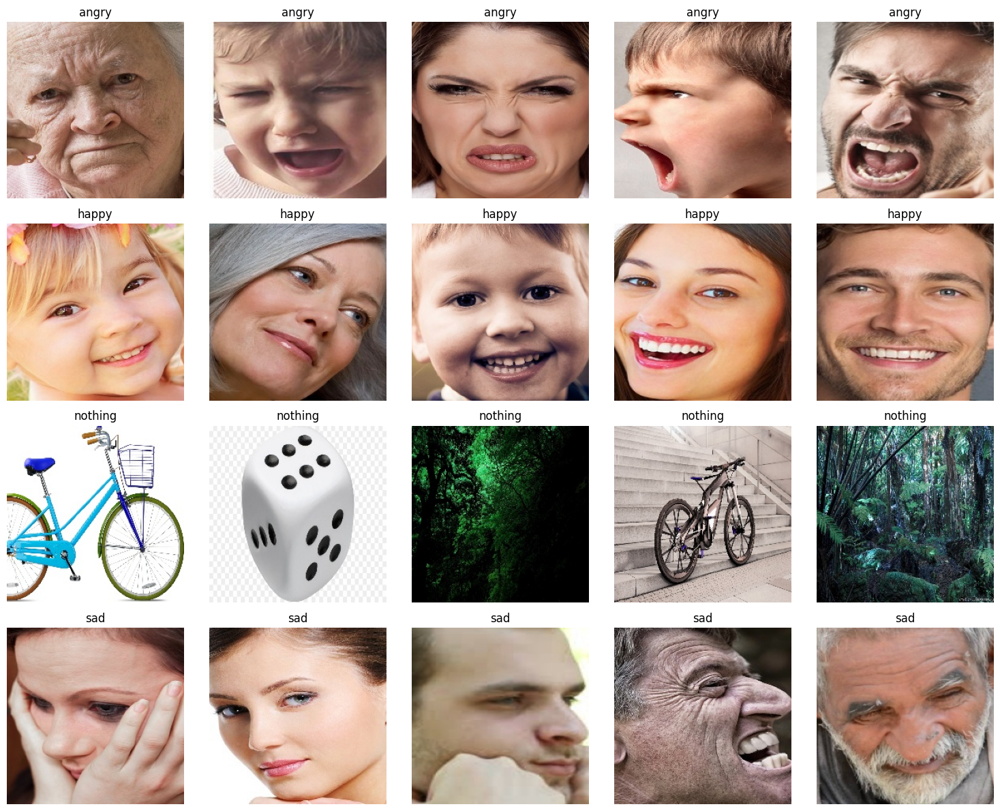

In [14]:
def show_random_images(data_dir, class_names: list, images_per_class: int =5):
    plt.figure(figsize=(images_per_class * 3, len(class_names) * 3))

    plot_idx = 1

    for class_name in class_names:
        class_dir = data_dir / class_name
        image_paths = [p for p in class_dir.iterdir()]

        sampled_paths = random.sample(image_paths, min(images_per_class, len(image_paths)))

        for img_path in sampled_paths:
            img = Image.open(img_path).convert("RGB")

            plt.subplot(len(class_names), images_per_class, plot_idx)
            plt.imshow(img)
            plt.title(class_name)
            plt.axis('off')
            plot_idx += 1

    plt.tight_layout()
    plt.show()

show_random_images(DATA_DIR, class_names)

In [15]:
base_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE_CUSTOM, IMG_SIZE_CUSTOM)),
    transforms.ToTensor(),
])

full_dataset = datasets.ImageFolder(
    root=DATA_DIR,
    transform=base_transform,
)

class_to_idx = full_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

print(class_to_idx)
print('Total Images', len(full_dataset))

{'angry': 0, 'happy': 1, 'nothing': 2, 'sad': 3}
Total Images 3945


In [16]:
with open('class_to_idx.json', 'w') as f:
    json.dump(class_to_idx, f, indent=2)

with open('idx_to_class.json', 'w') as f:
    json.dump(idx_to_class, f, indent=2)

#Stratified train/val/test split

In [17]:
targets = np.array(full_dataset.targets)
indices = np.arange(len(full_dataset))

train_idx, temp_idx, y_train, y_temp = train_test_split(
    indices,
    targets,
    test_size=0.30,
    stratify=targets,
    random_state=SEED
)


val_idx, test_idx, y_val, y_test = train_test_split(
    temp_idx,
    y_temp,
    test_size=0.50,
    stratify=y_temp,
    random_state=SEED
)

print('Train:', len(train_idx))
print('Val:', len(val_idx))
print('Test:', len(test_idx))

Train: 2761
Val: 592
Test: 592


In [18]:
def split_distribution(labels, split_name):
    counts = Counter(labels)
    rows = []

    for class_idx, count in sorted(counts.items()):
        rows.append({
            'split': split_name,
            'class_idx': class_idx,
            'class_name': idx_to_class[class_idx],
            'count': count
        })

    return pd.DataFrame(rows)


dist_df = pd.concat([
    split_distribution(y_train, 'train'),
    split_distribution(y_val, 'val'),
    split_distribution(y_test, 'test')

])

dist_df

,split,class_idx,class_name,count
0,train,0,angry,745
1,train,1,happy,726
2,train,2,nothing,765
3,train,3,sad,525
0,val,0,angry,159
1,val,1,happy,156
2,val,2,nothing,164
3,val,3,sad,113
0,test,0,angry,160
1,test,1,happy,155


In [19]:
pivot_dist = dist_df.pivot(
    index='class_name',
    columns='split',
    values='count'
)

pivot_dist

split,test,train,val
class_name,,,
angry,160,745,159
happy,155,726,156
nothing,164,765,164
sad,113,525,113


In [20]:
splits = {
    'train_idx': train_idx.tolist(),
    'val_idx': val_idx.tolist(),
    'test_idx': test_idx.tolist(),
    'seed': SEED,
    'split_ratio':{
        'train': 0.70,
        'val': 0.15,
        'test': 0.15
    }
}


with open('splits.json', 'w') as f:
    json.dump(splits, f, indent=2)

print('Saved splits')

Saved splits


#Transforms for custom CNN

In [21]:
train_transform_custom = transforms.Compose([
    transforms.Resize((IMG_SIZE_CUSTOM, IMG_SIZE_CUSTOM)),

    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15,
        saturation=0.10
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean = [0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

In [22]:
eval_transform_custom = transforms.Compose([
    transforms.Resize((IMG_SIZE_CUSTOM, IMG_SIZE_CUSTOM)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean = [0.5, 0.5, 0.5],
        std=[0.5, 0.5, 0.5]
    )
])

In [23]:
train_dataset_full = datasets.ImageFolder(
    root=DATA_DIR,
    transform=train_transform_custom
)

eval_dataset_full = datasets.ImageFolder(
    root=DATA_DIR,
    transform=eval_transform_custom
)


train_dataset = Subset(train_dataset_full, train_idx)
val_dataset = Subset(eval_dataset_full, val_idx)
test_dataset = Subset(eval_dataset_full, test_idx)

len(train_dataset), len(val_dataset), len(test_dataset)

(2761, 592, 592)

In [24]:
assert train_dataset_full.class_to_idx == eval_dataset_full.class_to_idx
assert train_dataset_full.class_to_idx == class_to_idx

print('Class mapping is consistent')

Class mapping is consistent


#DataLoaders

In [25]:
def seed_worker(worker_id: int) -> None:
    worker_seed = SEED + worker_id
    np.random.seed(SEED)
    random.seed(worker_seed)

generator = torch.Generator()
generator.manual_seed(SEED)

In [26]:
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    worker_init_fn=seed_worker,
    generator=generator
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

In [27]:
images, labels = next(iter(train_loader))

print(images.shape)
print(labels.shape)
print(labels[:10])

torch.Size([64, 3, 128, 128])
torch.Size([64])
tensor([2, 1, 1, 3, 2, 0, 0, 2, 3, 2])


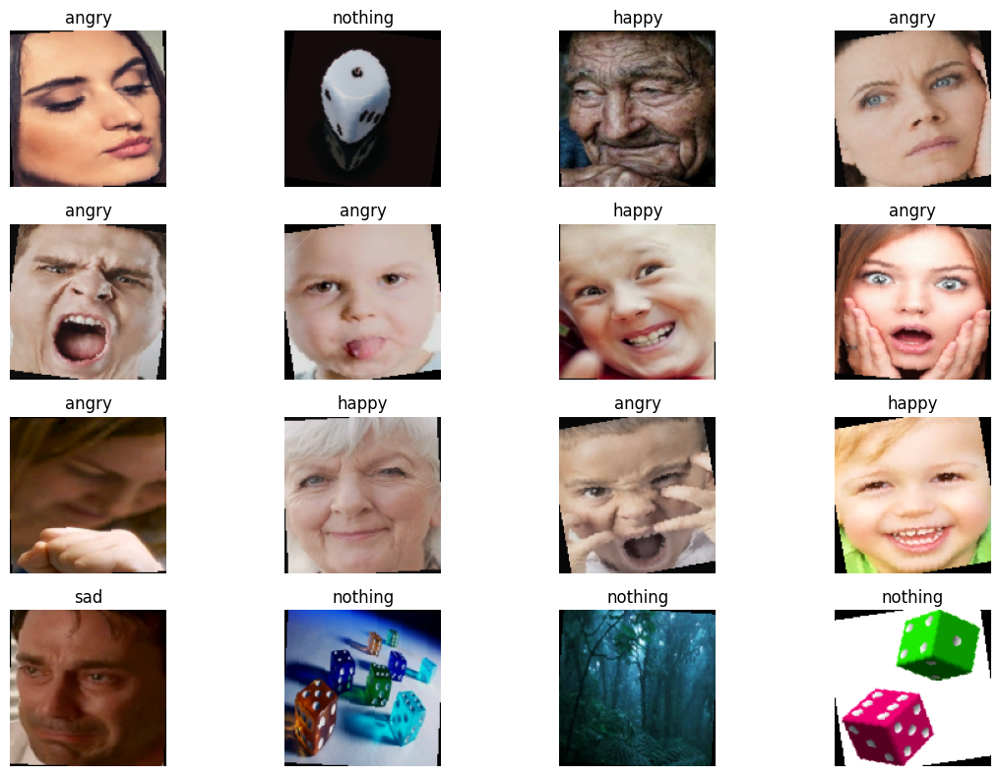

In [28]:
def denormalize(img):
    img = img * 0.5 + 0.5
    return img.clamp(0, 1)


images, labels = next(iter(train_loader))

plt.figure(figsize=(12, 8))


for i in range(min(16, len(images))):
    img = denormalize(images[i]).permute(1, 2, 0).cpu().numpy()
    label = idx_to_class[labels[i].item()]

    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')


plt.tight_layout()
plt.show()

#Custom CNN baseline

In [29]:
def compute_accuracy(logits: torch.Tensor, labels: torch.Tensor) -> float:
    preds = torch.argmax(logits, dim=1)
    correct = (preds == labels).sum().item()
    total = labels.size(0)
    return correct / total

In [30]:
class CustomCNN(nn.Module):
    def __init__(self, num_classes: int):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=32,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(
                in_channels=32,
                out_channels=64,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(in_channels=64,
                      out_channels=128,
                      kernel_size=3,
                      padding=1,
                      bias=False),

            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),


            nn.Conv2d(in_channels=128,
                      out_channels=256,
                      kernel_size=3,
                      padding=1,
                      bias=False),

            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(8 * 8 * 256, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(512, num_classes)
    )
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.classifier(x)
        return x


In [31]:
num_classes = 4
model = CustomCNN(num_classes).to(device)

In [32]:
images, labels = next(iter(train_loader))

images = images.to(device)
labels = labels.to(device)

logits = model(images)

print('Input shape:', images.shape)
print('Logits shpae:', logits.shape)
print("Labels shape", labels.shape)

Input shape: torch.Size([64, 3, 128, 128])
Logits shpae: torch.Size([64, 4])
Labels shape torch.Size([64])


In [33]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

In [34]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2,
)

In [35]:
def train_one_epoch(
        model: nn.Module,
        loader: DataLoader,
        criterion: nn.Module,
        optimizer: torch.optim.Optimizer,
        device: str
) -> dict:
    model.train()

    running_loss = 0.0
    running_correct = 0
    running_total = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        logits = model(images)
        loss = criterion(logits, labels)

        loss.backward()
        optimizer.step()

        batch_size = labels.size(0)
        running_loss += loss.item() * batch_size

        preds = torch.argmax(logits, dim=1)
        running_correct += (preds == labels).sum().item()
        running_total += batch_size

    epoch_loss = running_loss / running_total
    epoch_acc = running_correct / running_total


    return {
        'loss': epoch_loss,
        'accuracy': epoch_acc
    }




In [36]:
@torch.no_grad()
def evaluate(
        model: nn.Module,
        loader: DataLoader,
        criterion: nn.Module,
        device: str
) -> dict:
    model.eval()

    running_loss = 0.0
    running_correct = 0
    running_total = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = model(images)
        loss = criterion(logits, labels)

        batch_size = labels.size(0)
        running_loss += loss.item() * batch_size

        preds = torch.argmax(logits, dim=1)
        running_correct += (preds == labels).sum().item()
        running_total += batch_size


    epoch_loss = running_loss / running_total
    epoch_acc = running_correct / running_total

    return {
        'loss': epoch_loss,
        'accuracy': epoch_acc
    }

In [37]:
from time import time

def fit(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    scheduler,
    device: str,
    num_epochs: int,
    checkpoint_path: str = 'best_custom_cnn.pt'
) -> pd.DataFrame:

    history = []

    best_val_loss = float('inf')
    best_epoch = 0

    for epoch in range(1, num_epochs + 1):
        start_time = time()

        train_metrics = train_one_epoch(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics = evaluate(
            model=model,
            loader=val_loader,
            criterion=criterion,
            device=device
        )

        scheduler.step(val_metrics['loss'])

        current_lr = optimizer.param_groups[0]['lr']
        epoch_time = time() - start_time

        row = {
            'epoch': epoch,
            'train_loss': train_metrics['loss'],
            'train_accuracy': train_metrics['accuracy'],
            'val_loss': val_metrics['loss'],
            'val_accuracy': val_metrics['accuracy'],
            'lr': current_lr,
            'epoch_time_sec': epoch_time
        }

        history.append(row)

        print(
            f"Epoch [{epoch}/{num_epochs}]"
            f'train_loss={row['train_loss']:.4f}'
            f'train_acc={row['train_accuracy']:.4f}'
            f'val_loss={row['val_loss']:.4f}'
            f'val_acc={row['val_accuracy']:.4f}'
            f'lr={row['lr']:.6f}'
            f'time={row['epoch_time_sec']:.1f}s'
        )

        if val_metrics['loss'] < best_val_loss:
            best_val_loss = val_metrics['loss']
            best_epoch = epoch


            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'val_loss': val_metrics['loss'],
                'val_accuracy': val_metrics['accuracy'],
                'class_to_idx': class_to_idx,
                'idx_to_class': idx_to_class,
                'img_size': IMG_SIZE_CUSTOM,
                'num_classes': num_classes,
                'model_name': 'CustomCNN',
                'seed': SEED

            }, checkpoint_path)

            print(f'Saved best checkpoint at epoch {epoch}')


    print(f'Best epoch: {best_epoch}, best val loss: {best_val_loss}:.4f')

    return pd.DataFrame(history)




In [38]:
# images, labels = next(iter(train_loader))

# one_batch_dataset = torch.utils.data.TensorDataset(images, labels)

# one_batch_loader = DataLoader(
#     one_batch_dataset,
#     batch_size = len(labels)
# )

In [39]:
NUM_EPOCHS = 10

history_df = fit(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion ,
    optimizer=optimizer,
    scheduler=scheduler,
    device=device,
    num_epochs=NUM_EPOCHS,
    checkpoint_path='best_custom_cnn.pt'
)

history_df

Epoch [1/10]train_loss=1.9308train_acc=0.4969val_loss=0.8950val_acc=0.6199lr=0.001000time=11.5s
Saved best checkpoint at epoch 1
Epoch [2/10]train_loss=0.8981train_acc=0.5723val_loss=0.8357val_acc=0.5997lr=0.001000time=8.6s
Saved best checkpoint at epoch 2
Epoch [3/10]train_loss=0.8707train_acc=0.5766val_loss=0.8311val_acc=0.5980lr=0.001000time=8.5s
Saved best checkpoint at epoch 3
Epoch [4/10]train_loss=0.8331train_acc=0.5759val_loss=0.7902val_acc=0.6132lr=0.001000time=8.2s
Saved best checkpoint at epoch 4
Epoch [5/10]train_loss=0.8340train_acc=0.5806val_loss=0.7551val_acc=0.6486lr=0.001000time=7.5s
Saved best checkpoint at epoch 5
Epoch [6/10]train_loss=0.8120train_acc=0.5936val_loss=0.7767val_acc=0.6385lr=0.001000time=9.3s
Epoch [7/10]train_loss=0.8007train_acc=0.6135val_loss=0.7715val_acc=0.5929lr=0.001000time=7.8s
Epoch [8/10]train_loss=0.7755train_acc=0.6121val_loss=0.7646val_acc=0.6132lr=0.000500time=8.3s
Epoch [9/10]train_loss=0.7614train_acc=0.6302val_loss=0.7203val_acc=0.6419

,epoch,train_loss,train_accuracy,val_loss,val_accuracy,lr,epoch_time_sec
0,1,1.930805,0.496921,0.895017,0.619932,0.0010,11.512031
1,2,0.898073,0.572256,0.835743,0.599662,0.0010,8.578752
2,3,0.870692,0.576603,0.831122,0.597973,0.0010,8.464289
3,4,0.833129,0.575878,0.790173,0.613176,0.0010,8.153752
4,5,0.834033,0.580587,0.755122,0.648649,0.0010,7.482594
5,6,0.811964,0.593625,0.776749,0.638514,0.0010,9.310100
6,7,0.800685,0.613546,0.771483,0.592905,0.0010,7.847606
7,8,0.775463,0.612097,0.764584,0.613176,0.0005,8.268306
8,9,0.761442,0.630206,0.720350,0.641892,0.0005,8.705565
9,10,0.735566,0.653024,0.699600,0.667230,0.0005,7.466031


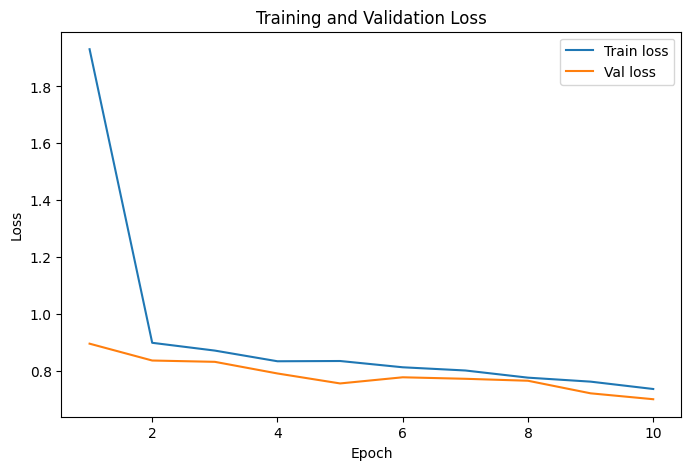

In [40]:
plt.figure(figsize=(8, 5))
plt.plot(history_df['epoch'], history_df['train_loss'], label='Train loss')
plt.plot(history_df['epoch'], history_df['val_loss'], label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

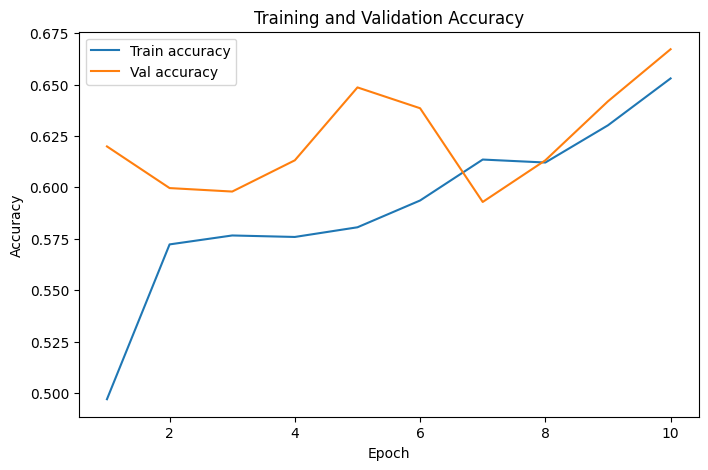

In [41]:
plt.figure(figsize=(8, 5))
plt.plot(history_df['epoch'], history_df['train_accuracy'], label='Train accuracy')
plt.plot(history_df['epoch'], history_df['val_accuracy'], label='Val accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

#Load best checkpoint

In [42]:
checkpoint = torch.load('best_custom_cnn.pt', map_location=device)

model.load_state_dict(checkpoint['model_state_dict'])

print('Loaded checkpoint from epoch: ', checkpoint['epoch'])
print('Best val loss: ', checkpoint['val_loss'])
print('Best val accuracy:', checkpoint['val_accuracy'])

Loaded checkpoint from epoch:  10
Best val loss:  0.699600110182891
Best val accuracy: 0.6672297297297297


#Evaluate on validation and test sets

In [43]:
val_metrics = evaluate(
    model=model,
    loader=val_loader,
    criterion=criterion,
    device=device
)

test_metrics = evaluate(
    model=model,
    loader=test_loader,
    criterion=criterion,
    device=device
)

print('Validation metrics: ', val_metrics)
print("Test metrics: ", test_metrics)

Validation metrics:  {'loss': 0.699600110182891, 'accuracy': 0.6672297297297297}
Test metrics:  {'loss': 0.6893723413750932, 'accuracy': 0.6891891891891891}


#Evaluation and error analysis

In [44]:
@torch.no_grad()
def collect_predictions(
    model: nn.Module,
    loader: DataLoader,
    device: str
) -> dict:
    model.eval()

    all_labels = []
    all_preds = []
    all_probs = []
    all_confidences = []

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = model(images)

        probs = torch.softmax(logits, dim=1)
        confidences, preds = torch.max(probs, dim=1)

        all_labels.append(labels.cpu())
        all_preds.append(preds.cpu())
        all_probs.append(probs.cpu())
        all_confidences.append(confidences.cpu())


    return {
        'labels': torch.cat(all_labels).numpy(),
        'preds': torch.cat(all_preds).numpy(),
        'probs': torch.cat(all_probs).numpy(),
        'confidences': torch.cat(all_confidences).numpy()
    }

In [45]:
val_preds = collect_predictions(
    model=model,
    loader=val_loader,
    device=device
)

test_preds = collect_predictions(
    model=model,
    loader=test_loader,
    device=device
)

In [46]:
print('Validation Classification Report')

print(
    classification_report(
        val_preds['labels'],
        val_preds['preds'],
        target_names=class_names,
        digits=4
    )
)

Validation Classification Report
              precision    recall  f1-score   support

       angry     0.5117    0.6855    0.5860       159
       happy     0.6038    0.6154    0.6095       156
     nothing     0.9879    0.9939    0.9909       164
         sad     0.4909    0.2389    0.3214       113

    accuracy                         0.6672       592
   macro avg     0.6486    0.6334    0.6270       592
weighted avg     0.6639    0.6672    0.6539       592



#Confusion Matrix

In [47]:
cm = confusion_matrix(
    val_preds['labels'],
    val_preds['preds'],
    normalize='true'
)

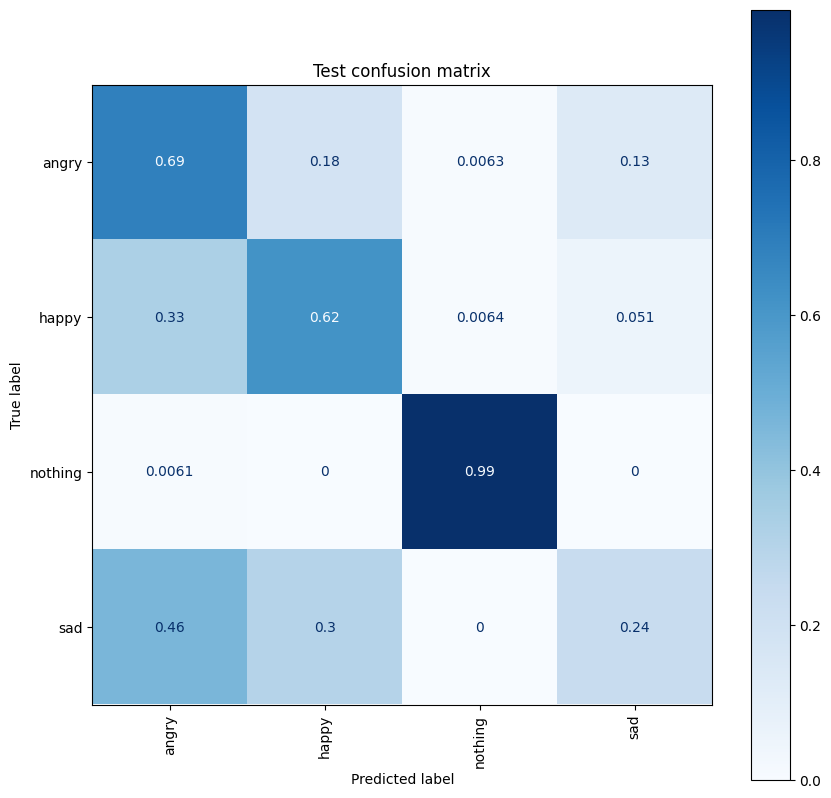

In [48]:
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(
    ax=ax,
    cmap='Blues',
    xticks_rotation=90,
    # values_format='d'
)

plt.title('Test confusion matrix')
plt.show()

In [49]:
def per_class_accuracy(labels, preds, class_names):
    rows = []

    for class_idx, class_name in enumerate(class_names):
        mask = labels == class_idx
        total = mask.sum()

        if total == 0:
            acc = np.nan
        else:
            acc = (preds[mask] == labels[mask]).mean()

        rows.append({
            'class_idx': class_idx,
            'class_name': class_name,
            'accuracy': acc,
            'support': int(total)
        })

    return pd.DataFrame(rows).sort_values('accuracy')

In [50]:
per_class_acc_df = per_class_accuracy(
    val_preds['labels'],
    val_preds['preds'],
    class_names
)

per_class_acc_df

,class_idx,class_name,accuracy,support
3,3,sad,0.238938,113
1,1,happy,0.615385,156
0,0,angry,0.685535,159
2,2,nothing,0.993902,164


#Error analysis

In [51]:
def get_subset_image_paths(subset: Subset) -> list[str]:
    dataset = subset.dataset
    indices = subset.indices

    return [
        dataset.samples[i][0]
        for i in indices
    ]

In [52]:
test_image_paths = get_subset_image_paths(test_dataset)

len(test_image_paths), len(test_preds['labels'])

(592, 592)

In [53]:
error_df = pd.DataFrame({
    'image_path': test_image_paths,
    'true_idx': test_preds['labels'],
    'pred_idx': test_preds['preds'],
    'confidence': test_preds['confidences']
})


error_df['true_class'] = error_df['true_idx'].map(idx_to_class)
error_df['pred_class'] = error_df['pred_idx'].map(idx_to_class)
error_df['is_correct'] = error_df['true_idx'] == error_df['pred_idx']

error_df.head()

,image_path,true_idx,pred_idx,confidence,true_class,pred_class,is_correct
0,/content/EmotionsDataset/data/happy/900.jpg,1,1,0.485520,happy,happy,True
1,/content/EmotionsDataset/data/nothing/1047.jpg,2,2,1.000000,nothing,nothing,True
2,/content/EmotionsDataset/data/angry/400.jpg,0,1,0.517506,angry,happy,False
3,/content/EmotionsDataset/data/nothing/517.jpg,2,2,1.000000,nothing,nothing,True
4,/content/EmotionsDataset/data/angry/402.jpg,0,0,0.702068,angry,angry,True


In [54]:
wrong_df = error_df[~error_df['is_correct']].copy()

print('Total test examples:', len(error_df))
print('Wrong Predictions:', len(wrong_df))
print('Error Rate:', len(wrong_df)/len(error_df))

Total test examples: 592
Wrong Predictions: 184
Error Rate: 0.3108108108108108


#Most confident wrong predictions

In [55]:
wrong_high_conf_df = wrong_df.sort_values(
    by='confidence',
    ascending=False
)

wrong_high_conf_df.head(20)

,image_path,true_idx,pred_idx,confidence,true_class,pred_class,is_correct
124,/content/EmotionsDataset/data/happy/1033.jpg,1,0,0.876098,happy,angry,False
252,/content/EmotionsDataset/data/sad/70.jpg,3,2,0.819671,sad,nothing,False
241,/content/EmotionsDataset/data/angry/744.jpg,0,3,0.748632,angry,sad,False
440,/content/EmotionsDataset/data/sad/437.jpg,3,0,0.727469,sad,angry,False
429,/content/EmotionsDataset/data/sad/482.jpg,3,0,0.723590,sad,angry,False
470,/content/EmotionsDataset/data/happy/700.jpg,1,0,0.717059,happy,angry,False
25,/content/EmotionsDataset/data/happy/356.jpg,1,0,0.704750,happy,angry,False
489,/content/EmotionsDataset/data/happy/170.jpg,1,0,0.700726,happy,angry,False
516,/content/EmotionsDataset/data/happy/226.jpg,1,0,0.679738,happy,angry,False
551,/content/EmotionsDataset/data/happy/575.jpg,1,0,0.677299,happy,angry,False


In [56]:
def show_prediction_errors(
    df: pd.DataFrame,
    max_images: int = 16,
    title: str = 'Prediction Error'
) -> None:
    sample_df = df.head(max_images)

    n_images = len(sample_df)
    n_cols = 4
    n_rows = int(np.ceil(n_images / n_cols))

    plt.figure(figsize=(n_cols * 4, n_rows * 4))

    for i, (_, row) in enumerate(sample_df.iterrows()):
        img = Image.open(row['image_path']).convert('RGB')

        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(img)
        plt.title(
            f"True: {row['true_class']}\n"
            f"Pred: {row['pred_class']}\n"
            f'Conf: {row['confidence']:.2f}'
        )
        plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


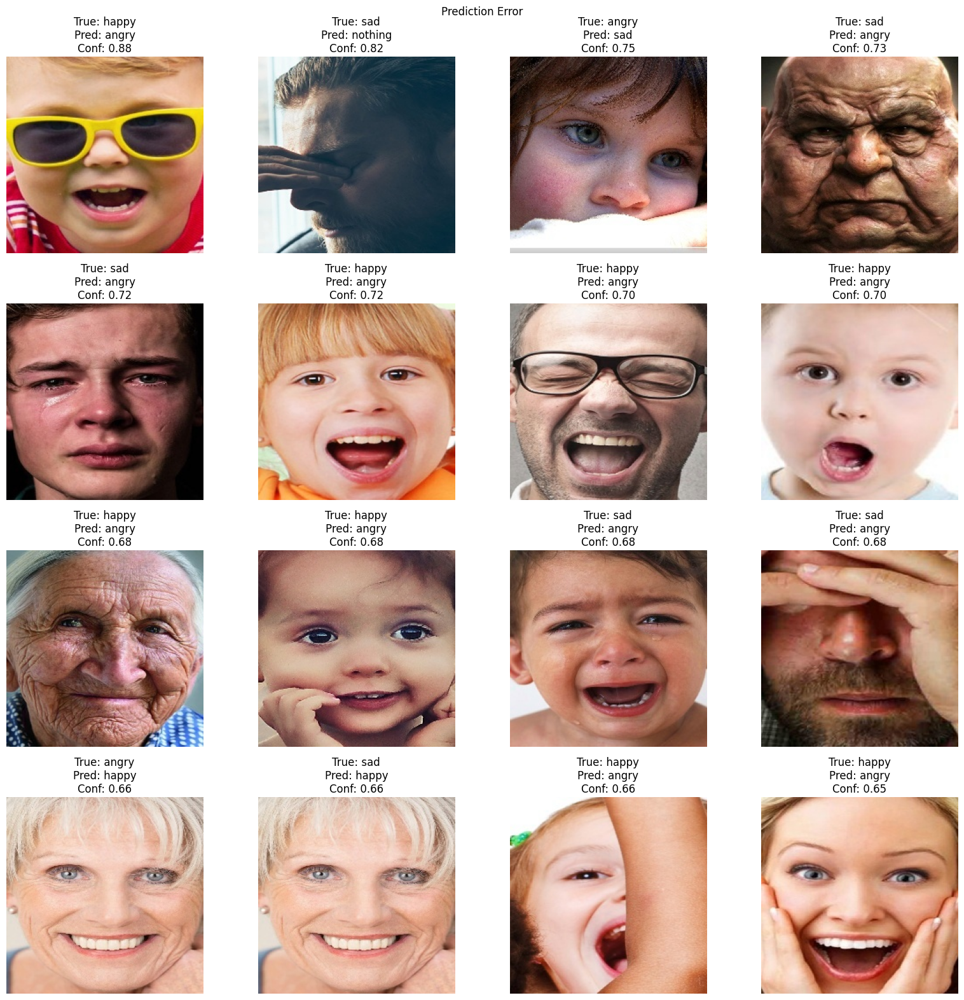

In [57]:
show_prediction_errors(
    wrong_high_conf_df
)

In [58]:
confusion_pairs_df = (
    wrong_df
    .groupby(['true_class', 'pred_class'])
    .size()
    .reset_index(name='count')
    .sort_values('count', ascending=False)
)

confusion_pairs_df

,true_class,pred_class,count
2,happy,angry,53
5,sad,angry,46
0,angry,happy,30
6,sad,happy,27
1,angry,sad,16
3,happy,sad,7
4,nothing,happy,3
7,sad,nothing,2


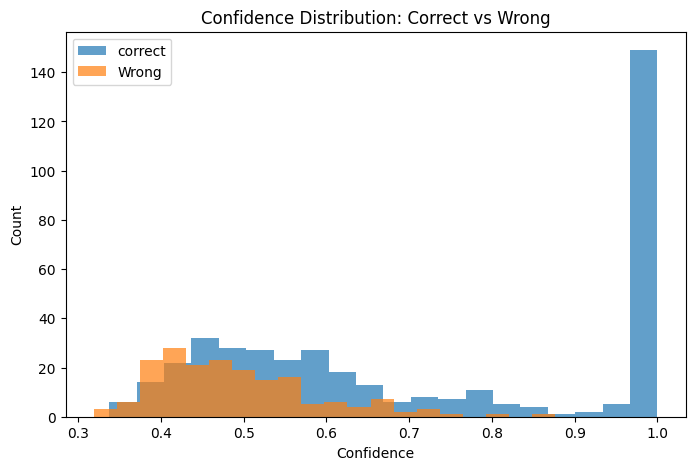

In [59]:
plt.figure(figsize=(8, 5))

plt.hist(
    error_df[error_df['is_correct']]['confidence'],
    bins=20,
    alpha=0.7,
    label='correct'
)

plt.hist(
    error_df[~error_df['is_correct']]['confidence'],
    bins=20,
    alpha=0.7,
    label='Wrong'
)

plt.xlabel('Confidence')
plt.ylabel('Count')
plt.title('Confidence Distribution: Correct vs Wrong')
plt.legend()
plt.show()

In [60]:
error_df.groupby('is_correct')['confidence'].describe()

,count,mean,std,min,25%,50%,75%,max
is_correct,,,,,,,,
False,184.0,0.489938,0.096502,0.318815,0.422602,0.473004,0.541068,0.876098
True,408.0,0.721272,0.236859,0.337385,0.503433,0.657093,0.999998,1.000000


#Better custom CNN

In [61]:
class CustomCNNV2(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),


            nn.Conv2d(128, 256, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.4),
            nn.Linear(256, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x

In [62]:
model_v2 = CustomCNNV2(num_classes).to(device)

model_v2

CustomCNNV2(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    

In [63]:
def count_parameters(model: nn.Module) -> dict:
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    return {
        'total_params': total_params,
        'trainable_params': trainable_params
    }

In [64]:
count_parameters(model_v2)

{'total_params': 389924, 'trainable_params': 389924}

In [65]:
count_parameters(model)

{'total_params': 8780068, 'trainable_params': 8780068}

In [66]:
dummy_128 = torch.randn(4, 3, 128, 128).to(device)
dummy_224 = torch.randn(4, 3, 224, 224).to(device)

with torch.no_grad():
    out_128 = model_v2(dummy_128)
    out_224 = model_v2(dummy_224)

out_128.shape, out_224.shape

(torch.Size([4, 4]), torch.Size([4, 4]))

#Gradient helper

In [67]:
def compute_grad_norm(model: nn.Module) -> float:
    total_norm = 0.0

    for param in model.parameters():
        if param.grad is not None:
            param_norm = param.grad.detach().data.norm(2)
            total_norm += param_norm.item() ** 2

    total_norm = total_norm ** 0.5
    return total_norm

In [68]:
def train_one_epoch(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    device: str,
) -> dict:
    model.train()

    running_loss = 0.0
    running_correct = 0
    running_total = 0

    grad_norms = []

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=False)

        logits = model(images)
        loss = criterion(logits, labels)

        loss.backward()

        grad_norm = compute_grad_norm(model)
        grad_norms.append(grad_norm)

        optimizer.step()

        batch_size = labels.size(0)
        running_loss += loss.item() * batch_size

        preds = torch.argmax(logits, dim=1)
        running_correct += (preds == labels).sum().item()
        running_total += batch_size

    epoch_loss = running_loss / running_total
    epoch_acc = running_correct / running_total
    avg_grad_norm = float(np.mean(grad_norms))

    return {
        'loss': epoch_loss,
        'accuracy': epoch_acc,
        'grad_norm': avg_grad_norm
    }

In [69]:
from time import time

def fit(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    scheduler,
    device: str,
    num_epochs: int,
    checkpoint_path: str = 'best_custom_cnn.pt'
) -> pd.DataFrame:

    history = []

    best_val_loss = float('inf')
    best_epoch = 0

    for epoch in range(1, num_epochs + 1):
        start_time = time()

        train_metrics = train_one_epoch(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics = evaluate(
            model=model,
            loader=val_loader,
            criterion=criterion,
            device=device
        )

        scheduler.step(val_metrics['loss'])

        current_lr = optimizer.param_groups[0]['lr']
        epoch_time = time() - start_time

        row = {
            'epoch': epoch,
            'train_loss': train_metrics['loss'],
            'train_accuracy': train_metrics['accuracy'],
            'train_grad_norm': train_metrics['grad_norm'],
            'val_loss': val_metrics['loss'],
            'val_accuracy': val_metrics['accuracy'],
            'lr': current_lr,
            'epoch_time_sec': epoch_time
        }

        history.append(row)

        print(
            f"Epoch [{epoch}/{num_epochs}]"
            f'train_loss={row['train_loss']:.4f}'
            f'train_acc={row['train_accuracy']:.4f}'
            f'val_loss={row['val_loss']:.4f}'
            f'val_acc={row['val_accuracy']:.4f}'
            f'grad_norm={row['train_grad_norm']:.4f}'
            f'lr={row['lr']:.6f}'
            f'time={row['epoch_time_sec']:.1f}s'
        )

        if val_metrics['loss'] < best_val_loss:
            best_val_loss = val_metrics['loss']
            best_epoch = epoch


            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'val_loss': val_metrics['loss'],
                'val_accuracy': val_metrics['accuracy'],
                'class_to_idx': class_to_idx,
                'idx_to_class': idx_to_class,
                'img_size': IMG_SIZE_CUSTOM,
                'num_classes': num_classes,
                'model_name': 'CustomCNN',
                'seed': SEED

            }, checkpoint_path)

            print(f'Saved best checkpoint at epoch {epoch}')


    print(f'Best epoch: {best_epoch}, best val loss: {best_val_loss}:.4f')

    return pd.DataFrame(history)




In [70]:
model_v2 = CustomCNNV2(num_classes).to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model_v2.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

In [71]:
NUM_EPOCHS = 10

history_v2_df = fit(
    model=model_v2,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    device=device,
    num_epochs=NUM_EPOCHS,
    checkpoint_path='best_custom_cnn_v2.pt'
)



Epoch [1/10]train_loss=0.9062train_acc=0.5527val_loss=0.8379val_acc=0.5422grad_norm=1.7487lr=0.001000time=9.2s
Saved best checkpoint at epoch 1
Epoch [2/10]train_loss=0.8493train_acc=0.5853val_loss=0.7818val_acc=0.6334grad_norm=1.6782lr=0.001000time=7.7s
Saved best checkpoint at epoch 2
Epoch [3/10]train_loss=0.8262train_acc=0.5925val_loss=0.7972val_acc=0.6706grad_norm=1.5167lr=0.001000time=8.6s
Epoch [4/10]train_loss=0.7916train_acc=0.6262val_loss=0.9002val_acc=0.6115grad_norm=1.4452lr=0.001000time=8.1s
Epoch [5/10]train_loss=0.7944train_acc=0.6183val_loss=0.7491val_acc=0.6351grad_norm=1.5907lr=0.001000time=8.2s
Saved best checkpoint at epoch 5
Epoch [6/10]train_loss=0.7781train_acc=0.6233val_loss=0.7349val_acc=0.6470grad_norm=1.5182lr=0.001000time=8.7s
Saved best checkpoint at epoch 6
Epoch [7/10]train_loss=0.7655train_acc=0.6356val_loss=0.8735val_acc=0.5338grad_norm=1.6213lr=0.001000time=14.6s
Epoch [8/10]train_loss=0.7907train_acc=0.6244val_loss=0.7700val_acc=0.6250grad_norm=1.9440

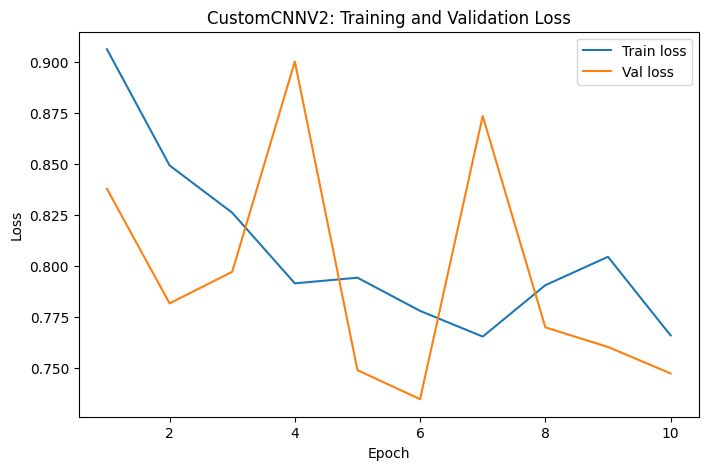

In [72]:
plt.figure(figsize=(8, 5))
plt.plot(history_v2_df["epoch"], history_v2_df["train_loss"], label="Train loss")
plt.plot(history_v2_df["epoch"], history_v2_df["val_loss"], label="Val loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("CustomCNNV2: Training and Validation Loss")
plt.legend()
plt.show()

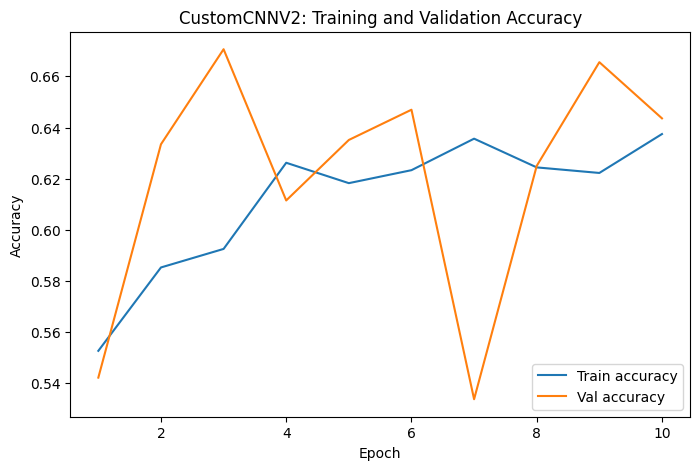

In [73]:
plt.figure(figsize=(8, 5))
plt.plot(history_v2_df["epoch"], history_v2_df["train_accuracy"], label="Train accuracy")
plt.plot(history_v2_df["epoch"], history_v2_df["val_accuracy"], label="Val accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("CustomCNNV2: Training and Validation Accuracy")
plt.legend()
plt.show()

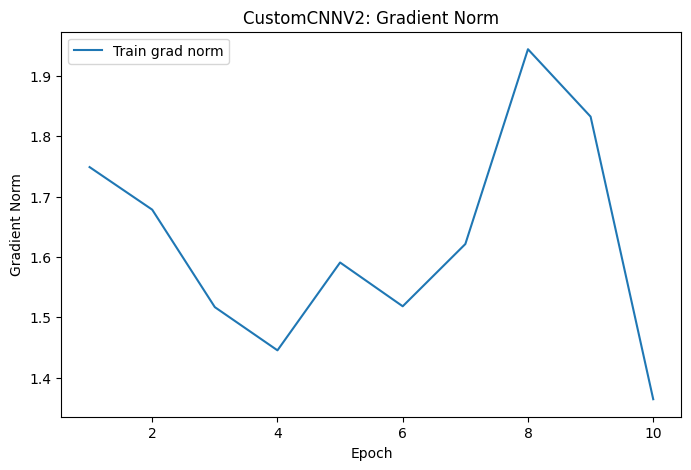

In [74]:
plt.figure(figsize=(8, 5))
plt.plot(history_v2_df["epoch"], history_v2_df["train_grad_norm"], label="Train grad norm")
plt.xlabel("Epoch")
plt.ylabel("Gradient Norm")
plt.title("CustomCNNV2: Gradient Norm")
plt.legend()
plt.show()

In [75]:
checkpoint = torch.load("best_custom_cnn_v2.pt", map_location=device)

model_v2.load_state_dict(checkpoint["model_state_dict"])

print("Loaded checkpoint from epoch:", checkpoint["epoch"])
print("Best val loss:", checkpoint["val_loss"])
print("Best val accuracy:", checkpoint["val_accuracy"])

Loaded checkpoint from epoch: 6
Best val loss: 0.7348654463484481
Best val accuracy: 0.6469594594594594


In [76]:
val_metrics_v2 = evaluate(
    model=model_v2,
    loader=val_loader,
    criterion=criterion,
    device=device,
)

test_metrics_v2 = evaluate(
    model=model_v2,
    loader=test_loader,
    criterion=criterion,
    device=device,
)

print("Validation metrics V2:", val_metrics_v2)
print("Test metrics V2:", test_metrics_v2)

Validation metrics V2: {'loss': 0.7348654463484481, 'accuracy': 0.6469594594594594}
Test metrics V2: {'loss': 0.715538324536504, 'accuracy': 0.6621621621621622}


In [77]:
test_preds_v2 = collect_predictions(
    model=model_v2,
    loader=test_loader,
    device=device,
)

In [78]:
print("CustomCNNV2 Test Classification Report")
print(
    classification_report(
        test_preds_v2["labels"],
        test_preds_v2["preds"],
        target_names=class_names,
        digits=4,
    )
)

CustomCNNV2 Test Classification Report
              precision    recall  f1-score   support

       angry     0.5074    0.6438    0.5675       160
       happy     0.5690    0.6387    0.6018       155
     nothing     0.9877    0.9756    0.9816       164
         sad     0.5660    0.2655    0.3614       113

    accuracy                         0.6622       592
   macro avg     0.6575    0.6309    0.6281       592
weighted avg     0.6678    0.6622    0.6519       592



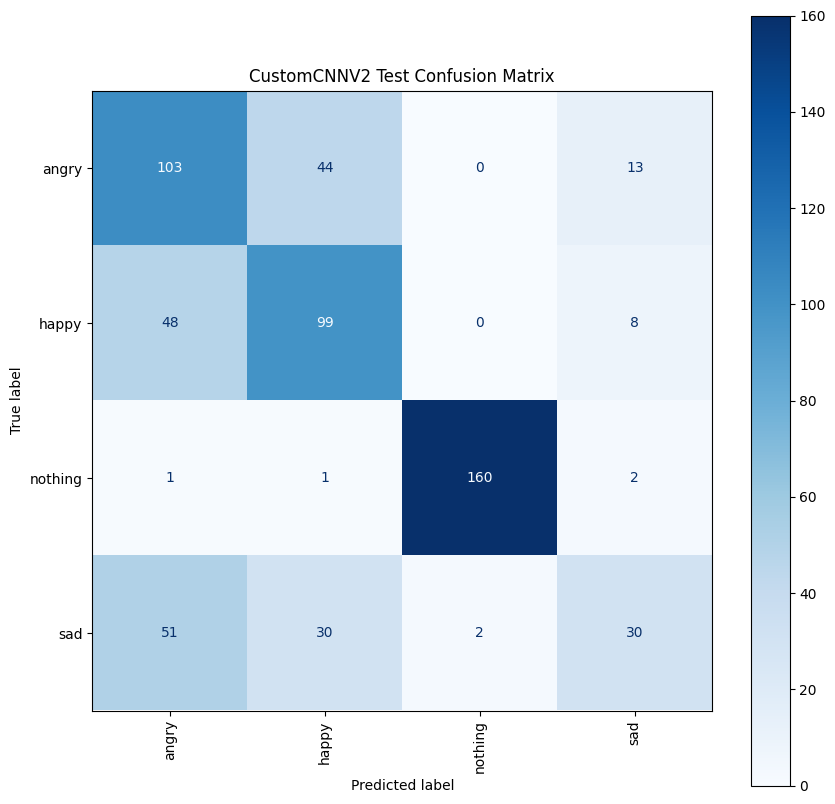

In [79]:
cm_v2 = confusion_matrix(
    test_preds_v2["labels"],
    test_preds_v2["preds"],
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_v2,
    display_labels=class_names,
)

fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(
    ax=ax,
    cmap="Blues",
    xticks_rotation=90,
    values_format="d",
)
plt.title("CustomCNNV2 Test Confusion Matrix")
plt.show()

In [80]:
!pip install -q psutil GPUtil

  Preparing metadata (setup.py) ... done


In [81]:
import psutil
import GPUtil

In [82]:
def get_system_usage() -> dict:
    cpu_percent = psutil.cpu_percent(interval=None)
    ram = psutil.virtual_memory()


    usage = {
        'cpu_percent': cpu_percent,
        'ram_used_gb': ram.used / (1024 ** 3),
        'ram_total_gb': ram.total / (1024 ** 3),
        'ram_percent': ram.percent,
        'gpu_name': None,
        'gpu_load_percent': None,
        "gpu_memory_used_mb": None,
        "gpu_memory_total_mb": None,
        'gpu_memory_percent': None,
    }


    gpus = GPUtil.getGPUs()

    if len(gpus) > 0:
        gpu = gpus[0]

        usage.update({
            'gpu_name': gpu.name,
            'gpu_load_percent': gpu.load * 100,
            'gpu_memory_used_mb': gpu.memoryUsed,
            'gpu_memory_total_mb': gpu.memoryTotal,
            'gpu_memory_percent': gpu.memoryUtil * 100
        })

    return usage

In [83]:
get_system_usage()

{'cpu_percent': 91.2,
 'ram_used_gb': 2.717243194580078,
 'ram_total_gb': 12.671417236328125,
 'ram_percent': 24.6,
 'gpu_name': 'Tesla T4',
 'gpu_load_percent': 0.0,
 'gpu_memory_used_mb': 2065.0,
 'gpu_memory_total_mb': 15360.0,
 'gpu_memory_percent': 13.444010416666666}

In [84]:
from time import time

def fit(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    scheduler,
    device: str,
    num_epochs: int,
    checkpoint_path: str = 'best_model.pt'
) -> pd.DataFrame:

    history = []

    best_val_loss = float('inf')
    best_epoch = 0

    for epoch in range(1, num_epochs + 1):
        start_time = time()

        train_metrics = train_one_epoch(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )

        val_metrics = evaluate(
            model=model,
            loader=val_loader,
            criterion=criterion,
            device=device
        )

        scheduler.step(val_metrics['loss'])

        current_lr = optimizer.param_groups[0]['lr']
        epoch_time = time() - start_time

        usage = get_system_usage()

        row = {
            'epoch': epoch,
            'train_loss': train_metrics['loss'],
            'train_accuracy': train_metrics['accuracy'],
            'train_grad_norm': train_metrics['grad_norm'],
            'val_loss': val_metrics['loss'],
            'val_accuracy': val_metrics['accuracy'],
            'lr': current_lr,
            'epoch_time_sec': epoch_time,

            'cpu_percent': usage['cpu_percent'],
            'ram_used_gb': usage['ram_used_gb'],
            'ram_total_gb': usage['ram_total_gb'],
            'ram_percent': usage['ram_percent'],

            'gpu_name': usage['gpu_name'],
            'gpu_load_percent': usage['gpu_load_percent'],
            'gpu_memory_used_mb': usage['gpu_memory_used_mb'],
            'gpu_memory_total_mb': usage['gpu_memory_total_mb'],
            'gpu_memory_percent': usage['gpu_memory_percent']
        }

        history.append(row)

        print(
            f"Epoch [{epoch}/{num_epochs}] "
            f'train_loss={row['train_loss']:.4f} '
            f'train_acc={row['train_accuracy']:.4f} '
            f'val_loss={row['val_loss']:.4f} '
            f'val_acc={row['val_accuracy']:.4f} '
            f'grad_norm={row['train_grad_norm']:.4f} '
            f'lr={row['lr']:.6f} '
            f'time={row['epoch_time_sec']:.1f}s '
            f'cpu={row['cpu_percent']:.1f}% '
            f'ram={row['ram_percent']:.1f}% '
            f'gpu={row['gpu_load_percent'] if row['gpu_load_percent'] is not None else 'N/A'} '
            f'gpu_memory={row['gpu_memory_percent'] if row['gpu_memory_percent'] is not None else 'N/A'} '
        )

        if val_metrics['loss'] < best_val_loss:
            best_val_loss = val_metrics['loss']
            best_epoch = epoch


            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'val_loss': val_metrics['loss'],
                'val_accuracy': val_metrics['accuracy'],
                'class_to_idx': class_to_idx,
                'idx_to_class': idx_to_class,
                'img_size': IMG_SIZE_CUSTOM,
                'num_classes': num_classes,
                'model_name': 'CustomCNN',
                'seed': SEED

            }, checkpoint_path)

            print(f'Saved best checkpoint at epoch {epoch}')


    print(f'Best epoch: {best_epoch}, best val loss: {best_val_loss}:.4f')

    return pd.DataFrame(history)




#Pretrained ResNet as a feature extractor

In [85]:
weights = models.ResNet18_Weights.DEFAULT

pretrained_train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE_PRETRAINED, IMG_SIZE_PRETRAINED)),

    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(
        brightness=15,
        contrast=0.15,
        saturation=0.10
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean = weights.transforms().mean,
        std = weights.transforms().std
    )
])

In [86]:
pretrained_eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE_PRETRAINED, IMG_SIZE_PRETRAINED)),
    transforms.ToTensor(),

    transforms.Normalize(
        mean = weights.transforms().mean,
        std = weights.transforms().std
    )
])

In [87]:
pretrained_train_dataset_full = datasets.ImageFolder(
    root=DATA_DIR,
    transform=pretrained_train_transform
)

pretrained_eval_dataset_full = datasets.ImageFolder(
    root=DATA_DIR,
    transform=pretrained_eval_transform
)

assert pretrained_train_dataset_full.class_to_idx == class_to_idx
assert pretrained_eval_dataset_full.class_to_idx == class_to_idx

In [88]:
pretrained_train_dataset = Subset(pretrained_train_dataset_full, train_idx)
pretrained_val_dataset = Subset(pretrained_eval_dataset_full, val_idx)
pretrained_test_dataset = Subset(pretrained_eval_dataset_full, test_idx)

In [89]:
pretrained_train_loader = DataLoader(
    pretrained_train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    worker_init_fn=seed_worker,
    generator=generator
)

pretrained_val_loader = DataLoader(
    pretrained_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

pretained_test_loader = DataLoader(
    pretrained_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

In [90]:
images, labels = next(iter(pretrained_train_loader))

print("IMAGES: ", images.shape)
print("LABELS: ", labels.shape)

IMAGES:  torch.Size([64, 3, 224, 224])
LABELS:  torch.Size([64])


In [91]:
def build_resnet18_feature_extractor(num_classes: int) -> nn.Module:
    weights = models.ResNet18_Weights.DEFAULT

    model = models.resnet18(weights=weights)

    for param in model.parameters():
        param.requires_grad=False

    in_features = model.fc.in_features


    model.fc = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features, num_classes)
    )

    return model

In [92]:
resnet18_fe = build_resnet18_feature_extractor(num_classes).to(device)

resnet18_fe

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 113MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [93]:
count_parameters(resnet18_fe)

{'total_params': 11178564, 'trainable_params': 2052}

In [94]:
for name, param in resnet18_fe.named_parameters():
    if param.requires_grad:
        print(name, param.shape)

fc.1.weight torch.Size([4, 512])
fc.1.bias torch.Size([4])


#Forward pass sanity check

In [95]:
images, labels = next(iter(pretrained_train_loader))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    logits = resnet18_fe(images)

print('Images shape: ', images.shape)
print('Logits shape:', logits.shape)

Images shape:  torch.Size([64, 3, 224, 224])
Logits shape: torch.Size([64, 4])


In [96]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, resnet18_fe.parameters()),
    lr=1e-3,
    weight_decay=1e-4
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

In [97]:
NUM_EPOCHS = 10

history_resnet18_fe_df = fit(
    model=resnet18_fe,
    train_loader = pretrained_train_loader,
    val_loader = pretrained_val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    device=device,
    num_epochs=NUM_EPOCHS,
    checkpoint_path='best_resnet18_feature_extractor.pt'
)

history_resnet18_fe_df

Epoch [1/10] train_loss=1.2277 train_acc=0.4480 val_loss=1.1233 val_acc=0.4814 grad_norm=3.9193 lr=0.001000 time=35.1s cpu=99.7% ram=25.6% gpu=21.0 gpu_memory=14.915364583333332 
Saved best checkpoint at epoch 1
Epoch [2/10] train_loss=1.0292 train_acc=0.5150 val_loss=0.9747 val_acc=0.5321 grad_norm=3.1025 lr=0.001000 time=14.6s cpu=98.5% ram=25.9% gpu=46.0 gpu_memory=14.915364583333332 
Saved best checkpoint at epoch 2
Epoch [3/10] train_loss=0.9821 train_acc=0.5342 val_loss=0.9253 val_acc=0.5389 grad_norm=3.4071 lr=0.001000 time=12.7s cpu=98.1% ram=26.0% gpu=60.0 gpu_memory=14.915364583333332 
Saved best checkpoint at epoch 3
Epoch [4/10] train_loss=0.9312 train_acc=0.5614 val_loss=0.8901 val_acc=0.5676 grad_norm=3.0171 lr=0.001000 time=12.4s cpu=99.0% ram=26.2% gpu=56.99999999999999 gpu_memory=14.915364583333332 
Saved best checkpoint at epoch 4
Epoch [5/10] train_loss=0.9237 train_acc=0.5621 val_loss=0.8691 val_acc=0.5878 grad_norm=3.0959 lr=0.001000 time=12.9s cpu=98.9% ram=25.9% 

,epoch,train_loss,train_accuracy,train_grad_norm,val_loss,val_accuracy,lr,epoch_time_sec,cpu_percent,ram_used_gb,ram_total_gb,ram_percent,gpu_name,gpu_load_percent,gpu_memory_used_mb,gpu_memory_total_mb,gpu_memory_percent
0,1,1.227746,0.448026,3.919296,1.123262,0.481419,0.001,35.129533,99.7,2.584492,12.671417,25.6,Tesla T4,21.0,2291.0,15360.0,14.915365
1,2,1.029222,0.515031,3.102547,0.974747,0.532095,0.001,14.612080,98.5,2.623001,12.671417,25.9,Tesla T4,46.0,2291.0,15360.0,14.915365
2,3,0.982124,0.534227,3.407145,0.925266,0.538851,0.001,12.671532,98.1,2.622429,12.671417,26.0,Tesla T4,60.0,2291.0,15360.0,14.915365
3,4,0.931220,0.561391,3.017095,0.890097,0.567568,0.001,12.433492,99.0,2.659088,12.671417,26.2,Tesla T4,57.0,2291.0,15360.0,14.915365
4,5,0.923657,0.562115,3.095922,0.869074,0.587838,0.001,12.901258,98.9,2.611454,12.671417,25.9,Tesla T4,72.0,2291.0,15360.0,14.915365
5,6,0.885424,0.578051,2.994063,0.847906,0.570946,0.001,12.338426,98.6,2.606979,12.671417,25.8,Tesla T4,72.0,2291.0,15360.0,14.915365
6,7,0.881910,0.580949,2.945779,0.834239,0.596284,0.001,12.190035,99.2,2.613174,12.671417,25.9,Tesla T4,63.0,2291.0,15360.0,14.915365
7,8,0.879528,0.580225,3.161804,0.833310,0.579392,0.001,13.248873,99.9,2.523544,12.671417,25.2,Tesla T4,49.0,2291.0,15360.0,14.915365
8,9,0.875885,0.561391,3.112559,0.811241,0.601351,0.001,13.500000,99.0,2.495960,12.671417,25.0,Tesla T4,79.0,2291.0,15360.0,14.915365
9,10,0.861060,0.572619,2.739496,0.807136,0.635135,0.001,12.828106,99.1,2.525295,12.671417,25.2,Tesla T4,37.0,2291.0,15360.0,14.915365


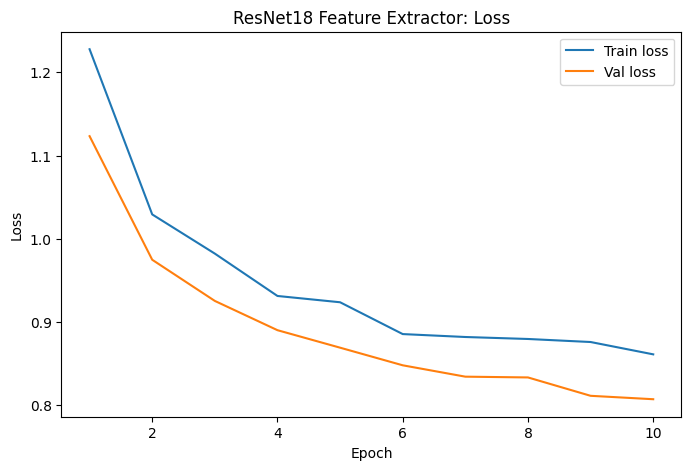

In [98]:
#Loss
plt.figure(figsize=(8, 5))
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["train_loss"], label="Train loss")
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["val_loss"], label="Val loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("ResNet18 Feature Extractor: Loss")
plt.legend()
plt.show()

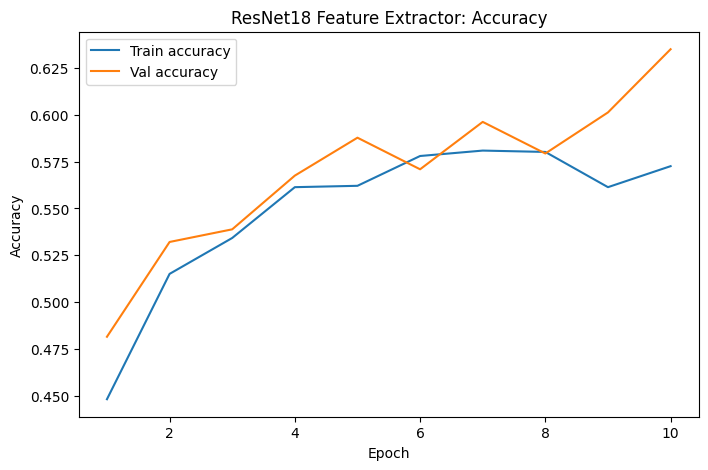

In [99]:
#Accuracy
plt.figure(figsize=(8, 5))
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["train_accuracy"], label="Train accuracy")
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["val_accuracy"], label="Val accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("ResNet18 Feature Extractor: Accuracy")
plt.legend()
plt.show()

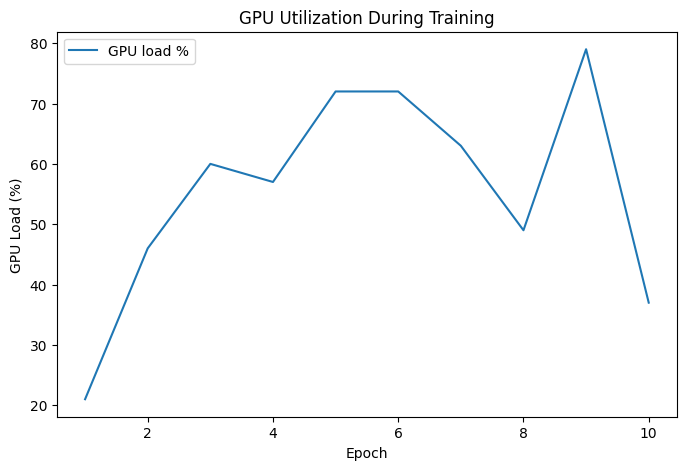

In [100]:
#Gpu load
plt.figure(figsize=(8, 5))
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["gpu_load_percent"], label="GPU load %")
plt.xlabel("Epoch")
plt.ylabel("GPU Load (%)")
plt.title("GPU Utilization During Training")
plt.legend()
plt.show()

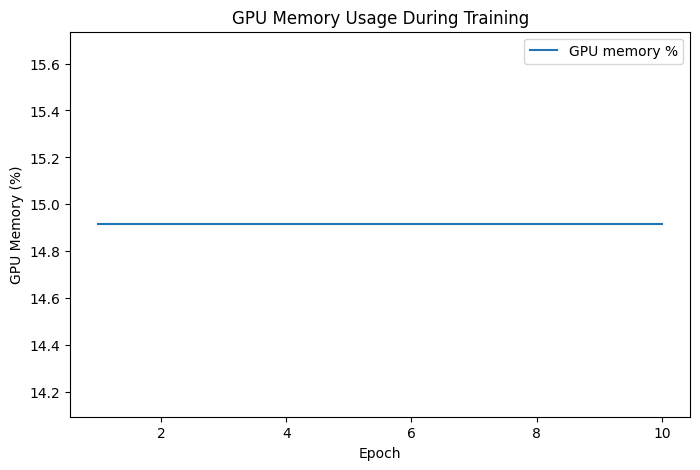

In [101]:
#Gpu Memory
plt.figure(figsize=(8, 5))
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["gpu_memory_percent"], label="GPU memory %")
plt.xlabel("Epoch")
plt.ylabel("GPU Memory (%)")
plt.title("GPU Memory Usage During Training")
plt.legend()
plt.show()

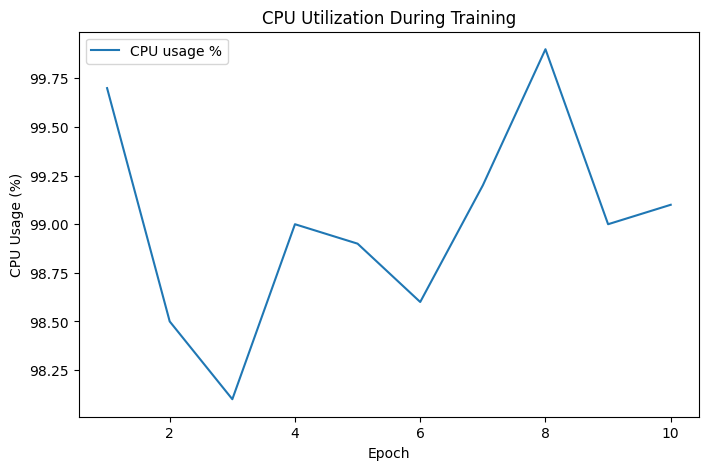

In [102]:
#CPU
plt.figure(figsize=(8, 5))
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["cpu_percent"], label="CPU usage %")
plt.xlabel("Epoch")
plt.ylabel("CPU Usage (%)")
plt.title("CPU Utilization During Training")
plt.legend()
plt.show()

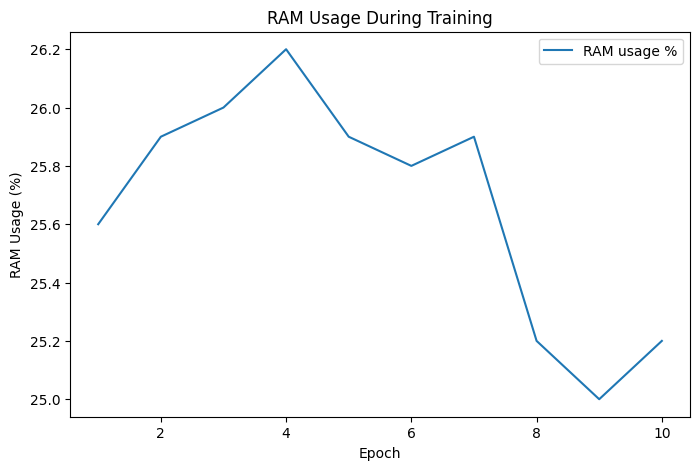

In [103]:
#RAM
plt.figure(figsize=(8, 5))
plt.plot(history_resnet18_fe_df["epoch"], history_resnet18_fe_df["ram_percent"], label="RAM usage %")
plt.xlabel("Epoch")
plt.ylabel("RAM Usage (%)")
plt.title("RAM Usage During Training")
plt.legend()
plt.show()

In [104]:
checkpoint = torch.load("best_resnet18_feature_extractor.pt", map_location=device)

resnet18_fe.load_state_dict(checkpoint["model_state_dict"])

print("Loaded checkpoint from epoch:", checkpoint["epoch"])
print("Best val loss:", checkpoint["val_loss"])
print("Best val accuracy:", checkpoint["val_accuracy"])

Loaded checkpoint from epoch: 10
Best val loss: 0.8071355868030239
Best val accuracy: 0.6351351351351351


In [105]:
val_metrics_resnet18_fe = evaluate(
    model=resnet18_fe,
    loader=pretrained_val_loader,
    criterion=criterion,
    device=device,
)

test_metrics_resnet18_fe = evaluate(
    model=resnet18_fe,
    loader=pretained_test_loader,
    criterion=criterion,
    device=device,
)

print("Validation metrics:", val_metrics_resnet18_fe)
print("Test metrics:", test_metrics_resnet18_fe)

Validation metrics: {'loss': 0.8071355868030239, 'accuracy': 0.6351351351351351}
Test metrics: {'loss': 0.7985416811865729, 'accuracy': 0.6317567567567568}


In [106]:
test_preds_resnet18_fe = collect_predictions(
    model=resnet18_fe,
    loader=pretained_test_loader,
    device=device,
)

In [107]:
print("ResNet18 Feature Extractor Test Classification Report")
print(
    classification_report(
        test_preds_resnet18_fe["labels"],
        test_preds_resnet18_fe["preds"],
        target_names=class_names,
        digits=4,
    )
)

ResNet18 Feature Extractor Test Classification Report
              precision    recall  f1-score   support

       angry     0.4837    0.5563    0.5174       160
       happy     0.5652    0.4194    0.4815       155
     nothing     0.9819    0.9939    0.9879       164
         sad     0.4488    0.5044    0.4750       113

    accuracy                         0.6318       592
   macro avg     0.6199    0.6185    0.6155       592
weighted avg     0.6364    0.6318    0.6302       592



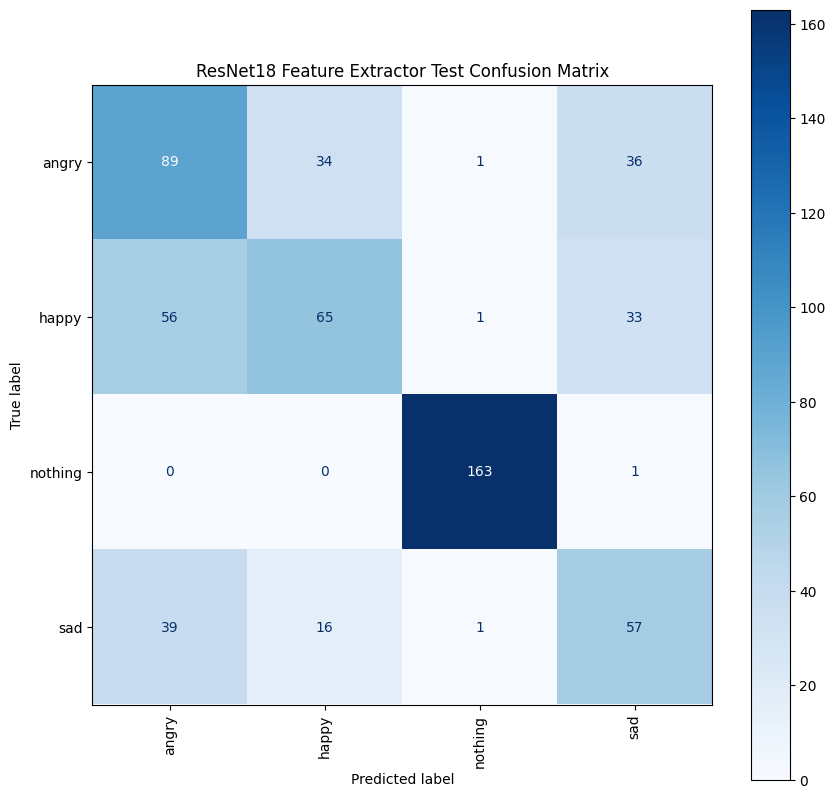

In [108]:
cm_resnet18_fe = confusion_matrix(
    test_preds_resnet18_fe["labels"],
    test_preds_resnet18_fe["preds"],
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_resnet18_fe,
    display_labels=class_names,
)

fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(
    ax=ax,
    cmap="Blues",
    xticks_rotation=90,
    values_format="d",
)
plt.title("ResNet18 Feature Extractor Test Confusion Matrix")
plt.show()

In [109]:
comparison_df = pd.DataFrame([
    {
        "model": "CustomCNNV2",
        "val_loss": val_metrics_v2["loss"],
        "val_accuracy": val_metrics_v2["accuracy"],
        "test_loss": test_metrics_v2["loss"],
        "test_accuracy": test_metrics_v2["accuracy"],
    },
    {
        "model": "ResNet18 Feature Extractor",
        "val_loss": val_metrics_resnet18_fe["loss"],
        "val_accuracy": val_metrics_resnet18_fe["accuracy"],
        "test_loss": test_metrics_resnet18_fe["loss"],
        "test_accuracy": test_metrics_resnet18_fe["accuracy"],
    },
])

comparison_df

,model,val_loss,val_accuracy,test_loss,test_accuracy
0,CustomCNNV2,0.734865,0.646959,0.715538,0.662162
1,ResNet18 Feature Extractor,0.807136,0.635135,0.798542,0.631757


In [110]:
def build_resnet18(num_classes: int) -> nn.Module:
    weights = models.ResNet18_Weights.DEFAULT

    model = models.resnet18(weights=weights)

    in_features = model.fc.in_features

    model.fc = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features, num_classes)
    )

    return model

In [111]:
resnet18_ft = build_resnet18(num_classes).to(device)

checkpoint = torch.load(
    '/content/best_resnet18_feature_extractor.pt',
    map_location=device,
)

resnet18_ft.load_state_dict(checkpoint['model_state_dict'])
print('Best validation accuracy:', checkpoint['val_accuracy'])

Best validation accuracy: 0.6351351351351351


In [112]:
def configure_resnet18_for_finetuning(model: nn.Module) -> None:
    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer4.parameters():
        param.requires_grad = True

    for param in model.fc.parameters():
        param.requires_grad = True

In [113]:
configure_resnet18_for_finetuning(resnet18_ft)

In [114]:
trainable_parameters = []

for name, param in resnet18_ft.named_parameters():
    if param.requires_grad:
        trainable_parameters.append({
            "name": name,
            "shape": tuple(param.shape),
            'num_params': param.numel()
        })

trainable_df = pd.DataFrame(trainable_parameters)

print('Trainable parameters:', trainable_df['num_params'].sum())
trainable_df

Trainable parameters: 8395780


,name,shape,num_params
0,layer4.0.conv1.weight,"(512, 256, 3, 3)",1179648
1,layer4.0.bn1.weight,"(512,)",512
2,layer4.0.bn1.bias,"(512,)",512
3,layer4.0.conv2.weight,"(512, 512, 3, 3)",2359296
4,layer4.0.bn2.weight,"(512,)",512
5,layer4.0.bn2.bias,"(512,)",512
6,layer4.0.downsample.0.weight,"(512, 256, 1, 1)",131072
7,layer4.0.downsample.1.weight,"(512,)",512
8,layer4.0.downsample.1.bias,"(512,)",512
9,layer4.1.conv1.weight,"(512, 512, 3, 3)",2359296


#Handle BatchNorm correctly

In [115]:
def set_frozen_batchnorm_to_eval(model: nn.Module) -> None:
    frozen_prefixes = (
        'bn1',
        'layer1',
        'layer2',
        'layer3'
    )

    for name, module in model.named_modules():
        if isinstance(module, nn.BatchNorm2d):
            is_frozen_part = any(
                name == prefix or name.startswith(prefix + '.')
                for prefix in frozen_prefixes
                )

            if is_frozen_part:
                module.eval()

In [116]:
criterion = nn.CrossEntropyLoss()

optimizer_ft = torch.optim.AdamW(
    [
        {
            'params': resnet18_ft.layer4.parameters(),
            'lr': 1e-5
        },
        {
            'params': resnet18_ft.fc.parameters(),
            'lr': 1e-3
        }
    ],
    weight_decay = 1e-4
)

In [117]:
for i, group in enumerate(optimizer_ft.param_groups):
    print(f"Parameter group {i}: lr={group['lr']}")

Parameter group 0: lr=1e-05
Parameter group 1: lr=0.001


In [118]:
scheduler_ft = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_ft,
    mode='min',
    factor=0.5,
    patience=2
    )

#Mixed precision

In [119]:
AMP_ENABLED = device == 'cuda'

scaler = torch.amp.GradScaler(
    'cuda',
    enabled = AMP_ENABLED
)

In [120]:
import time

def train_one_epoch_finetune(
        model: nn.Module,
        loader: DataLoader,
        criterion: nn.Module,
        optimizer: torch.optim.Optimizer,
        scaler: torch.amp.GradScaler,
        device: str,
        monitor_every_n_batches: int = 20,
        max_grad_norm: float = 5.0
)-> dict:
    model.train()
    set_frozen_batchnorm_to_eval(model)

    running_loss = 0.0
    running_correct = 0
    running_total = 0

    grad_norms = []
    resources_samples = []
    data_wait_times = []
    compute_times = []

    end_of_previous_batch = time.perf_counter()

    for batch_idx, (images, labels) in enumerate(loader):
        batch_start = time.perf_counter()

        data_wait_times.append(batch_start - end_of_previous_batch)

        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        compute_start = time.perf_counter()

        with torch.autocast(
            device_type='cuda',
            dtype=torch.float16,
            enabled=(device=='cuda')
        ):
            logits = model(images)
            loss = criterion(logits, labels)

        scaler.scale(loss).backward()

        scaler.unscale_(optimizer)

        grad_norm = compute_grad_norm(model)
        grad_norms.append(grad_norm)

        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            max_norm=max_grad_norm
        )

        scaler.step(optimizer)
        scaler.update()

        if device == 'cuda':
            torch.cuda.synchronize()

        compute_end = time.perf_counter()
        compute_times.append(compute_end - compute_start)

        batch_size = labels.size(0)

        running_loss += loss.item() * batch_size

        preds = torch.argmax(logits, dim=1)
        running_correct += (preds == labels).sum().item()
        running_total += batch_size

        if batch_idx % monitor_every_n_batches == 0:
            resources_samples.append(get_system_usage)

        end_of_previous_batch = time.perf_counter()


    return {
        'loss': running_loss / running_total,
        'accuracy': running_correct / running_total,
        'grad_norm': float(np.mean(grad_norms)),
        'max_grad_norm': float(np.max(grad_norms)),
        'avg_data_wait_sec': float(np.mean(data_wait_times)),
        'avg_compute_sec': float(np.mean(compute_times))
        }



In [121]:
@torch.no_grad()
def evaluate_amp(
        model: nn.Module,
        loader: DataLoader,
        criterion: nn.Module,
        device: str
) -> dict:
    model.eval()

    running_loss = 0.0
    running_correct = 0
    running_total = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        with torch.autocast(
            device_type='cuda',
            dtype=torch.float16,
            enabled = (device == 'cuda')
        ):
            logits = model(images)
            loss = criterion(logits, labels)

        batch_size = labels.size(0)

        running_loss += loss.item() * batch_size

        preds = torch.argmax(logits, dim=1)
        running_correct += (preds == labels).sum().item()
        running_total += batch_size

    return {
        'loss': running_loss / running_total,
        'accuracy': running_correct / running_total
    }


In [122]:
def fit_finetune(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    scheduler,
    scaler: torch.amp.GradScaler,
    device: str,
    num_epochs: int,
    checkpoint_path: str = "best_resnet18_finetuned.pt",
) -> pd.DataFrame:

    history = []

    best_val_loss = float("inf")
    best_epoch = 0

    for epoch in range(1, num_epochs + 1):
        epoch_start = time.perf_counter()

        train_metrics = train_one_epoch_finetune(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            scaler=scaler,
            device=device,
        )

        val_metrics = evaluate_amp(
            model=model,
            loader=val_loader,
            criterion=criterion,
            device=device,
        )

        scheduler.step(val_metrics["loss"])

        epoch_time_sec = time.perf_counter() - epoch_start

        row = {
            "epoch": epoch,
            "train_loss": train_metrics["loss"],
            "train_accuracy": train_metrics["accuracy"],
            "val_loss": val_metrics["loss"],
            "val_accuracy": val_metrics["accuracy"],
            "avg_grad_norm": train_metrics["grad_norm"],
            "max_grad_norm": train_metrics["max_grad_norm"],
            "avg_data_wait_sec": train_metrics["avg_data_wait_sec"],
            "avg_compute_sec": train_metrics["avg_compute_sec"],
            "epoch_time_sec": epoch_time_sec,
            "backbone_lr": optimizer.param_groups[0]["lr"],
            "head_lr": optimizer.param_groups[1]["lr"],
        }

        history.append(row)

        print(
            f"Epoch [{epoch}/{num_epochs}] | "
            f"train_loss={row['train_loss']:.4f} | "
            f"train_acc={row['train_accuracy']:.4f} | "
            f"val_loss={row['val_loss']:.4f} | "
            f"val_acc={row['val_accuracy']:.4f} | "
            f"backbone_lr={row['backbone_lr']:.7f} | "
            f"head_lr={row['head_lr']:.7f} | "
            f"grad={row['avg_grad_norm']:.3f} | "
            f"time={row['epoch_time_sec']:.1f}s"
        )


        if val_metrics["loss"] < best_val_loss:
            best_val_loss = val_metrics["loss"]
            best_epoch = epoch

            torch.save(
                {
                    "epoch": epoch,
                    "model_name": "ResNet18FineTunedLayer4",
                    "model_state_dict": model.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "scheduler_state_dict": scheduler.state_dict(),
                    "scaler_state_dict": scaler.state_dict(),
                    "val_loss": val_metrics["loss"],
                    "val_accuracy": val_metrics["accuracy"],
                    "class_to_idx": class_to_idx,
                    "idx_to_class": idx_to_class,
                    "img_size": IMG_SIZE_PRETRAINED,
                    "normalization_mean": list(
                        models.ResNet18_Weights.DEFAULT.transforms().mean
                    ),
                    "normalization_std": list(
                        models.ResNet18_Weights.DEFAULT.transforms().std
                    ),
                    "finetuned_layers": ["layer4", "fc"],
                    "seed": SEED,
                },
                checkpoint_path,
            )

            print(f"  Saved best checkpoint at epoch {epoch}")

    print(
        f"\nBest epoch: {best_epoch} | "
        f"best validation loss: {best_val_loss:.4f}"
    )

    return pd.DataFrame(history)

In [123]:
NUM_FINETUNE_EPOCHS = 8

history_resnet18_ft_df = fit_finetune(
    model=resnet18_ft,
    train_loader=pretrained_train_loader,
    val_loader=pretrained_val_loader,
    criterion=criterion,
    optimizer=optimizer_ft,
    scheduler=scheduler_ft,
    scaler=scaler,
    device=device,
    num_epochs=NUM_FINETUNE_EPOCHS,
    checkpoint_path="best_resnet18_finetuned.pt",
)

history_resnet18_ft_df

Epoch [1/8] | train_loss=0.8489 | train_acc=0.5936 | val_loss=0.7779 | val_acc=0.6115 | backbone_lr=0.0000100 | head_lr=0.0010000 | grad=4.021 | time=12.7s
  Saved best checkpoint at epoch 1
Epoch [2/8] | train_loss=0.8196 | train_acc=0.5878 | val_loss=0.7395 | val_acc=0.6385 | backbone_lr=0.0000100 | head_lr=0.0010000 | grad=3.793 | time=13.3s
  Saved best checkpoint at epoch 2
Epoch [3/8] | train_loss=0.7911 | train_acc=0.6067 | val_loss=0.7560 | val_acc=0.6132 | backbone_lr=0.0000100 | head_lr=0.0010000 | grad=3.775 | time=12.3s
Epoch [4/8] | train_loss=0.8011 | train_acc=0.6088 | val_loss=0.7607 | val_acc=0.5828 | backbone_lr=0.0000100 | head_lr=0.0010000 | grad=3.774 | time=12.3s
Epoch [5/8] | train_loss=0.7806 | train_acc=0.6186 | val_loss=0.7071 | val_acc=0.6824 | backbone_lr=0.0000100 | head_lr=0.0010000 | grad=3.796 | time=17.4s
  Saved best checkpoint at epoch 5
Epoch [6/8] | train_loss=0.7538 | train_acc=0.6320 | val_loss=0.7172 | val_acc=0.6419 | backbone_lr=0.0000100 | hea

,epoch,train_loss,train_accuracy,val_loss,val_accuracy,avg_grad_norm,max_grad_norm,avg_data_wait_sec,avg_compute_sec,epoch_time_sec,backbone_lr,head_lr
0,1,0.848922,0.593625,0.777886,0.611486,4.020535,9.630765,0.193270,0.066888,12.740871,0.00001,0.001
1,2,0.819565,0.587830,0.739550,0.638514,3.792663,8.766470,0.224232,0.050330,13.331480,0.00001,0.001
2,3,0.791126,0.606664,0.756022,0.613176,3.775310,8.680086,0.192924,0.055796,12.260191,0.00001,0.001
3,4,0.801086,0.608837,0.760672,0.582770,3.773852,6.599296,0.198666,0.052076,12.328963,0.00001,0.001
4,5,0.780649,0.618616,0.707069,0.682432,3.795915,8.235350,0.263556,0.049389,17.410493,0.00001,0.001
5,6,0.753838,0.632017,0.717201,0.641892,3.541284,9.458229,0.412241,0.053933,21.752378,0.00001,0.001
6,7,0.759996,0.633466,0.699431,0.673986,3.761244,7.367834,0.258264,0.050339,14.814416,0.00001,0.001
7,8,0.743359,0.641796,0.687628,0.690878,3.738803,7.944667,0.202849,0.052555,12.516047,0.00001,0.001


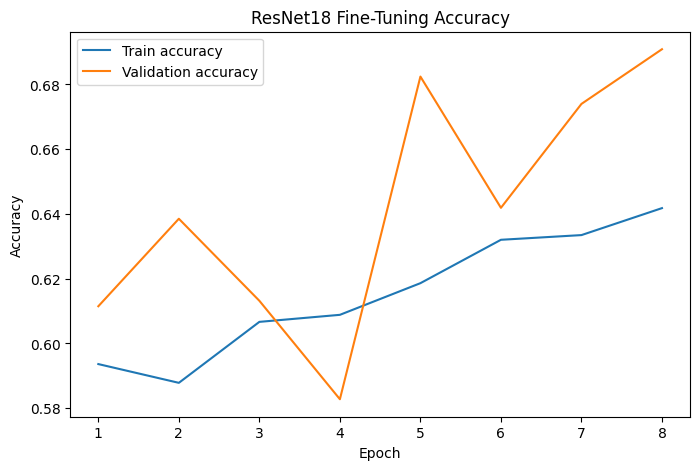

In [124]:
plt.figure(figsize=(8, 5))
plt.plot(
    history_resnet18_ft_df["epoch"],
    history_resnet18_ft_df["train_accuracy"],
    label="Train accuracy",
)
plt.plot(
    history_resnet18_ft_df["epoch"],
    history_resnet18_ft_df["val_accuracy"],
    label="Validation accuracy",
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("ResNet18 Fine-Tuning Accuracy")
plt.legend()
plt.show()

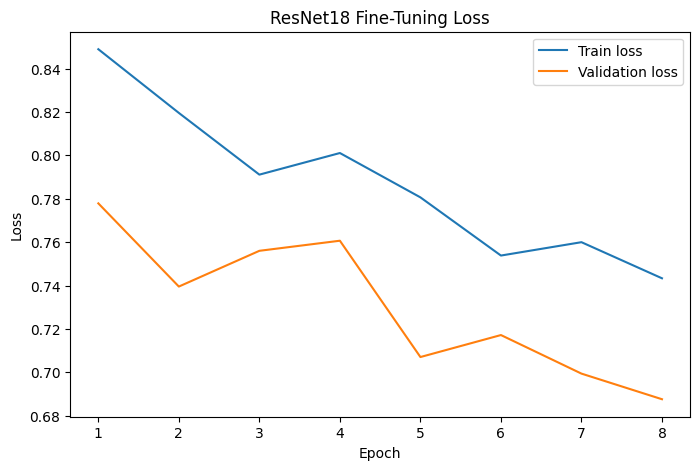

In [125]:
plt.figure(figsize=(8, 5))
plt.plot(
    history_resnet18_ft_df["epoch"],
    history_resnet18_ft_df["train_loss"],
    label="Train loss",
)
plt.plot(
    history_resnet18_ft_df["epoch"],
    history_resnet18_ft_df["val_loss"],
    label="Validation loss",
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("ResNet18 Fine-Tuning Loss")
plt.legend()
plt.show()

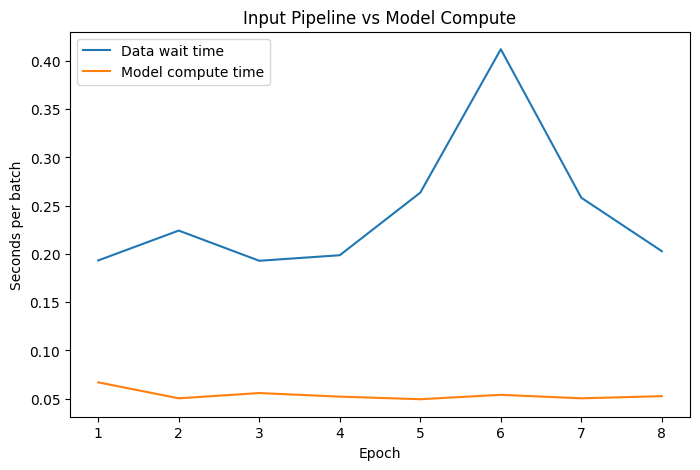

In [126]:
plt.figure(figsize=(8, 5))
plt.plot(
    history_resnet18_ft_df["epoch"],
    history_resnet18_ft_df["avg_data_wait_sec"],
    label="Data wait time",
)
plt.plot(
    history_resnet18_ft_df["epoch"],
    history_resnet18_ft_df["avg_compute_sec"],
    label="Model compute time",
)

plt.xlabel("Epoch")
plt.ylabel("Seconds per batch")
plt.title("Input Pipeline vs Model Compute")
plt.legend()
plt.show()

In [127]:
best_ft_checkpoint = torch.load(
    "best_resnet18_finetuned.pt",
    map_location=device,
)

resnet18_ft.load_state_dict(
    best_ft_checkpoint["model_state_dict"]
)

print("Loaded best fine-tuned checkpoint")
print("Best epoch:", best_ft_checkpoint["epoch"])
print("Best validation accuracy:", best_ft_checkpoint["val_accuracy"])

Loaded best fine-tuned checkpoint
Best epoch: 8
Best validation accuracy: 0.6908783783783784


In [128]:
test_metrics_resnet18_ft = evaluate_amp(
    model=resnet18_ft,
    loader=pretained_test_loader,
    criterion=criterion,
    device=device,
)

print("Fine-tuned ResNet18 test metrics:")
print(test_metrics_resnet18_ft)

Fine-tuned ResNet18 test metrics:
{'loss': 0.6738374039933488, 'accuracy': 0.6942567567567568}


In [129]:
test_preds_resnet18_ft = collect_predictions(
    model=resnet18_ft,
    loader=pretained_test_loader,
    device=device,
)

In [130]:
comparison_df = pd.DataFrame([
    {
        "model": "CustomCNNV2",
        "test_accuracy": test_metrics_v2["accuracy"],
        "test_loss": test_metrics_v2["loss"],
    },
    {
        "model": "ResNet18 Feature Extractor",
        "test_accuracy": test_metrics_resnet18_fe["accuracy"],
        "test_loss": test_metrics_resnet18_fe["loss"],
    },
    {
        "model": "ResNet18 Fine-Tuned layer4 + fc",
        "test_accuracy": test_metrics_resnet18_ft["accuracy"],
        "test_loss": test_metrics_resnet18_ft["loss"],
    },
])

comparison_df.sort_values(
    by="test_accuracy",
    ascending=False,
)

,model,test_accuracy,test_loss
2,ResNet18 Fine-Tuned layer4 + fc,0.694257,0.673837
0,CustomCNNV2,0.662162,0.715538
1,ResNet18 Feature Extractor,0.631757,0.798542


#Grad-CAM implementation

In [149]:
import torch.nn.functional as F

class GradCAM:
    def __init__(
            self,
            model: nn.Module,
            target_layer: nn.Module
    ):
        self.model = model
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        self.forward_handle = self.target_layer.register_forward_hook(
            self._save_activations
        )

    def _save_activations(
            self,
            module: nn.Module,
            inputs: tuple,
            output: torch.Tensor
    ) -> None:
        self.activations = output.detach()

        output.register_hook(self._save_gradients)


    def _save_gradients(self, gradients: torch.Tensor) -> None:
        self.gradients = gradients.detach()

    def generate(
            self,
            image_tensor: torch.Tensor,
            target_class: int | None = None,
    ) -> dict:
        """
        image_tensor shape: [1, 3, H, W]
        target_class:
            None -> explain model's predicted class
            int -> explain a specified class
        """
        self.model.eval()

        self.activations = None
        self.gradients = None

        image_tensor = (
            image_tensor
            .to(device)
            .clone()
            .detach()
            .requires_grad_(True)
        )

        self.model.zero_grad(set_to_none=True)

        logits = self.model(image_tensor)
        probabilities = torch.softmax(logits, dim=1)

        if target_class is None:
            target_idx = torch.argmax(logits, dim=1)
        else:
            target_idx = torch.tensor(
                [target_class],
                device=device,
                dtype=torch.long
            )

        target_score = logits.gather(
            dim=1,
            index=target_idx.unsqueeze(1)
        ).sum()

        target_score.backward()

        if self.activations is None or self.gradients is None:
            raise RuntimeError(
                "Grad-CAM failed to capture activations or gradients"
            )

        channel_weights = self.gradients.mean(
            dim = (2, 3),
            keepdim=True
        )

        cam = (channel_weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)

        cam = F.interpolate(
            cam,
            size=image_tensor.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        cam_amin = cam.amin(dim=(2, 3), keepdim=True)
        cam_amax = cam.amax(dim=(2, 3), keepdim=True)

        cam = (cam - cam_amin) / (cam_amax - cam_amin + 1e-8)

        return {
            'logits': logits.detach().cpu(),
            'probabilities': probabilities.detach().cpu(),
            'target_idx': target_idx.detach().cpu(),
            'cam': cam.squeeze(0).squeeze().detach().cpu()
        }

    def close(self) -> None:
        self.forward_handle.remove()


In [150]:
grad_cam = GradCAM(
    model=resnet18_ft,
    target_layer=resnet18_ft.layer4[-1]
)

In [151]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


def show_gradcam(
    image_path: str,
    grad_cam: GradCAM,
    eval_transform,
    idx_to_class: dict,
    true_class_idx: int | None = None,
    target_class_idx: int | None = None,
) -> None:
    original_image = Image.open(image_path).convert("RGB")

    # Same preprocessing used by ResNet18 evaluation.
    image_tensor = eval_transform(original_image).unsqueeze(0)

    result = grad_cam.generate(
        image_tensor=image_tensor,
        target_class=target_class_idx,
    )

    cam = result["cam"].numpy()
    probs = result["probabilities"][0].numpy()

    predicted_idx = int(torch.argmax(result["logits"], dim=1).item())
    explained_idx = int(result["target_idx"].item())

    display_image = original_image.resize(
        (IMG_SIZE_PRETRAINED, IMG_SIZE_PRETRAINED)
    )
    display_image_np = np.asarray(display_image)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(display_image_np)
    axes[0].set_title(
        f"Original\n"
        f"True: {idx_to_class[true_class_idx] if true_class_idx is not None else 'Unknown'}\n"
        f"Pred: {idx_to_class[predicted_idx]} ({probs[predicted_idx]:.2%})"
    )
    axes[0].axis("off")

    axes[1].imshow(cam, cmap="jet")
    axes[1].set_title(
        f"Grad-CAM for: {idx_to_class[explained_idx]}"
    )
    axes[1].axis("off")

    axes[2].imshow(display_image_np)
    axes[2].imshow(cam, cmap="jet", alpha=0.45)
    axes[2].set_title("Overlay")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

In [152]:
test_image_paths_ft = get_subset_image_paths(
    pretrained_test_dataset
)

assert len(test_image_paths_ft) == len(
    test_preds_resnet18_ft["labels"]
)

gradcam_df = pd.DataFrame({
    "image_path": test_image_paths_ft,
    "true_idx": test_preds_resnet18_ft["labels"],
    "pred_idx": test_preds_resnet18_ft["preds"],
    "confidence": test_preds_resnet18_ft["confidences"],
})

gradcam_df["is_correct"] = (
    gradcam_df["true_idx"] == gradcam_df["pred_idx"]
)

gradcam_df["true_class"] = gradcam_df["true_idx"].map(idx_to_class)
gradcam_df["pred_class"] = gradcam_df["pred_idx"].map(idx_to_class)

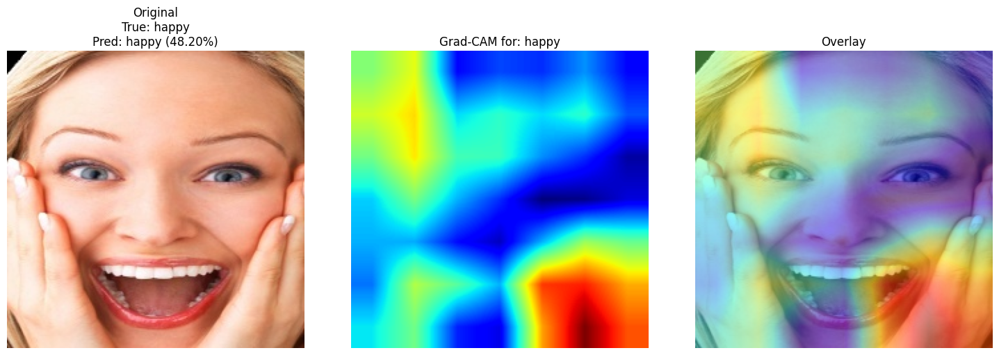

In [167]:
correct_example = (
    gradcam_df[gradcam_df["is_correct"]]
    .sort_values("confidence", ascending=False)
    .iloc[306]
)

show_gradcam(
    image_path=correct_example["image_path"],
    grad_cam=grad_cam,
    eval_transform=pretrained_eval_transform,
    idx_to_class=idx_to_class,
    true_class_idx=int(correct_example["true_idx"]),
    target_class_idx=int(correct_example["pred_idx"]),
)

In [168]:
high_conf_errors = (
    gradcam_df[~gradcam_df["is_correct"]]
    .sort_values("confidence", ascending=False)
)

high_conf_errors[
    [
        "true_class",
        "pred_class",
        "confidence",
        "image_path",
    ]
].head(10)

,true_class,pred_class,confidence,image_path
245,angry,sad,0.770991,/content/EmotionsDataset/data/angry/893.jpg
117,happy,sad,0.747804,/content/EmotionsDataset/data/happy/855.jpg
269,angry,sad,0.743002,/content/EmotionsDataset/data/angry/80.jpg
358,happy,sad,0.719068,/content/EmotionsDataset/data/happy/120.jpg
175,angry,sad,0.688001,/content/EmotionsDataset/data/angry/730.jpg
96,sad,angry,0.685112,/content/EmotionsDataset/data/sad/322.jpg
414,angry,sad,0.670857,/content/EmotionsDataset/data/angry/778.jpg
557,happy,sad,0.669865,/content/EmotionsDataset/data/happy/416.jpg
92,happy,sad,0.669205,/content/EmotionsDataset/data/happy/477.jpg
451,happy,angry,0.649302,/content/EmotionsDataset/data/happy/613.jpg


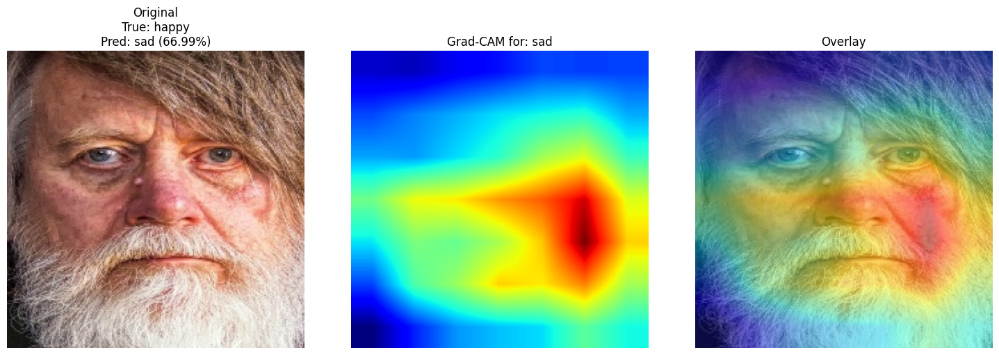

In [176]:
wrong_example = high_conf_errors.iloc[7]

show_gradcam(
    image_path=wrong_example["image_path"],
    grad_cam=grad_cam,
    eval_transform=pretrained_eval_transform,
    idx_to_class=idx_to_class,
    true_class_idx=int(wrong_example["true_idx"]),
    target_class_idx=int(wrong_example["pred_idx"]),
)

True class: angry
Predicted class: sad
Confidence: 0.7709908


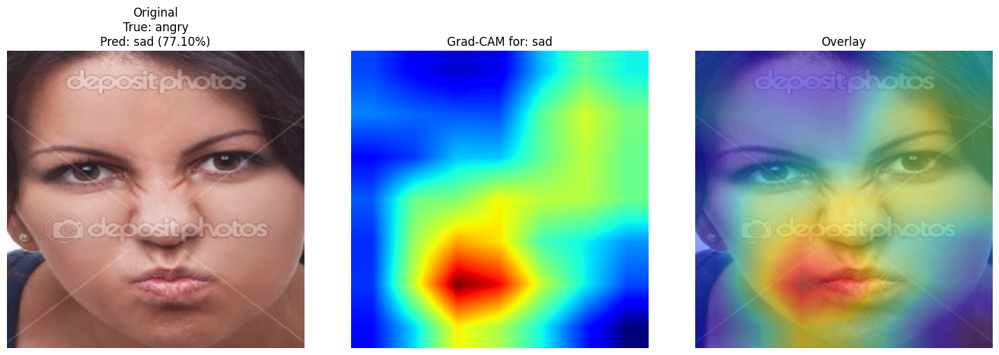

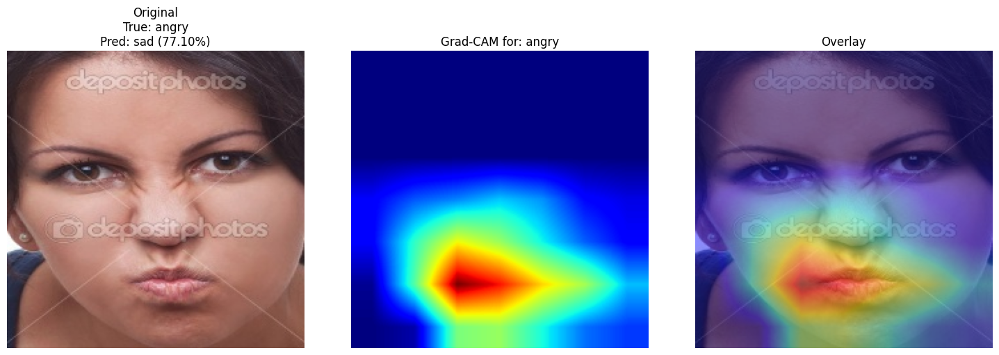

In [177]:
wrong_example = high_conf_errors.iloc[0]

print("True class:", wrong_example["true_class"])
print("Predicted class:", wrong_example["pred_class"])
print("Confidence:", wrong_example["confidence"])

# Why did it predict the wrong class?
show_gradcam(
    image_path=wrong_example["image_path"],
    grad_cam=grad_cam,
    eval_transform=pretrained_eval_transform,
    idx_to_class=idx_to_class,
    true_class_idx=int(wrong_example["true_idx"]),
    target_class_idx=int(wrong_example["pred_idx"]),
)

# Where is the model finding evidence for the actual label?
show_gradcam(
    image_path=wrong_example["image_path"],
    grad_cam=grad_cam,
    eval_transform=pretrained_eval_transform,
    idx_to_class=idx_to_class,
    true_class_idx=int(wrong_example["true_idx"]),
    target_class_idx=int(wrong_example["true_idx"]),
)